# import libraries

In [1]:
import numpy as np
import pandas as pd
import pyarrow as pa
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn import model_selection
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge , Lasso
from sklearn.linear_model import RidgeCV
from statsmodels.stats.descriptivestats import Description
from statsmodels.stats.diagnostic import het_goldfeldquandt
from sklearn.preprocessing import FunctionTransformer
from statsmodels.stats.outliers_influence import variance_inflation_factor
from scipy.stats import shapiro
from sklearn.datasets import make_regression
from statsmodels.stats.diagnostic import normal_ad
import statsmodels.api as sm
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import normalize
import numpy as np

import warnings
warnings.filterwarnings("ignore")

In [2]:
Data=pd.read_csv('/Users/nick/Desktop/dataset2.csv', delimiter=';')

In [3]:
Data

,temperature,exhaust_vacuum,amb_pressure,r_humidity,energy_production
0,9.59,38.56,1017.01,60.10,481.30
1,12.04,42.34,1019.72,94.67,465.36
2,13.87,45.08,1024.42,81.69,465.48
3,13.72,54.30,1017.89,79.08,467.05
4,15.14,49.64,1023.78,75.00,463.58
...,...,...,...,...,...
9563,17.10,49.69,1005.53,81.82,457.32
9564,24.73,65.34,1015.42,52.80,446.92
9565,30.44,56.24,1005.19,56.24,429.34
9566,23.00,66.05,1020.61,80.29,421.57


In [4]:
Data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9568 entries, 0 to 9567
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   temperature        9568 non-null   float64
 1   exhaust_vacuum     9568 non-null   float64
 2   amb_pressure       9568 non-null   float64
 3   r_humidity         9568 non-null   float64
 4   energy_production  9568 non-null   float64
dtypes: float64(5)
memory usage: 373.9 KB


In [5]:
Data.describe()

,temperature,exhaust_vacuum,amb_pressure,r_humidity,energy_production
count,9568.000000,9568.000000,9568.000000,9568.000000,9568.000000
mean,19.651231,54.305804,1013.259078,73.308978,454.365009
std,7.452473,12.707893,5.938784,14.600269,17.066995
min,1.810000,25.360000,992.890000,25.560000,420.260000
25%,13.510000,41.740000,1009.100000,63.327500,439.750000
50%,20.345000,52.080000,1012.940000,74.975000,451.550000
75%,25.720000,66.540000,1017.260000,84.830000,468.430000
max,37.110000,81.560000,1033.300000,100.160000,495.760000


Ohk vivek then we will go to EDA:

# EDA

### Checking For Null Values

In [6]:
Data.isna().sum()

temperature          0
exhaust_vacuum       0
amb_pressure         0
r_humidity           0
energy_production    0
dtype: int64

<Axes: title={'center': 'Null Value Presence Visualisation'}>

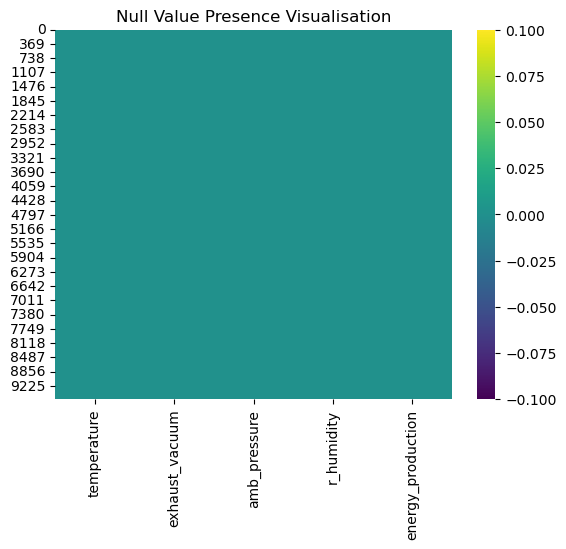

In [7]:
plt.title("Null Value Presence Visualisation",color='k')
sns.heatmap(Data.isnull(),cmap='viridis')

So we can see from above that there is no null values present in our data set and we will check whether there present Duplicate data entry is there or not

### Checking For Duplicate Values

In [8]:
Data[Data.duplicated()].shape

(41, 5)

In [9]:
Data[Data.duplicated()]

,temperature,exhaust_vacuum,amb_pressure,r_humidity,energy_production
2066,10.72,41.17,1019.68,60.71,479.21
2780,28.41,75.60,1018.48,56.07,440.28
3333,24.79,75.60,1017.07,68.23,440.05
3467,7.64,41.17,1020.01,75.14,488.53
3550,25.42,75.60,1017.39,77.63,438.24
3747,11.61,41.17,1019.57,58.82,476.81
4292,12.27,41.17,1019.41,58.10,475.13
4528,24.63,59.57,1010.45,85.36,440.67
5065,8.57,41.17,1020.18,72.47,484.20
5564,11.82,41.17,1019.50,55.74,475.61


So here around 41 duplicate entries are there that we are gonna remove from our dataframe....

In [10]:
Data=Data.drop_duplicates().reset_index(drop=True)
Data[Data.duplicated()]

,temperature,exhaust_vacuum,amb_pressure,r_humidity,energy_production


So we successfully removed all duplicated entries Listen Now we will go for visualisation and other part of eda to check how our each feature datas are distributed by histograms and Q-Q plots etc..

Before proceeding we will do train test split as well as standardising of data too...

### Visualizing the Distribution of Continuous Features with the help of Histograms and Probability Plot

In [11]:
import pylab
from scipy import stats as stat

In [12]:
def plot_data(data,feature):
    plt.figure(figsize=(12,6))
    plt.subplot(1,2,1)
    data[feature].hist(color='lightseagreen',alpha=0.8)
    plt.subplot(1,2,2)
    stat.probplot(data[feature],dist='norm',plot=pylab)

Text(0.5, 1.0, 'r_humidity')

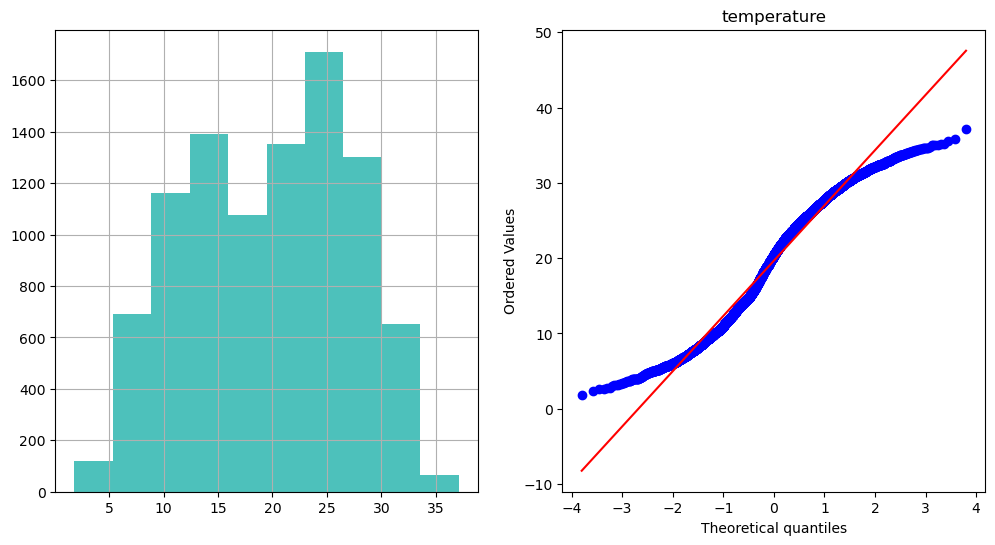

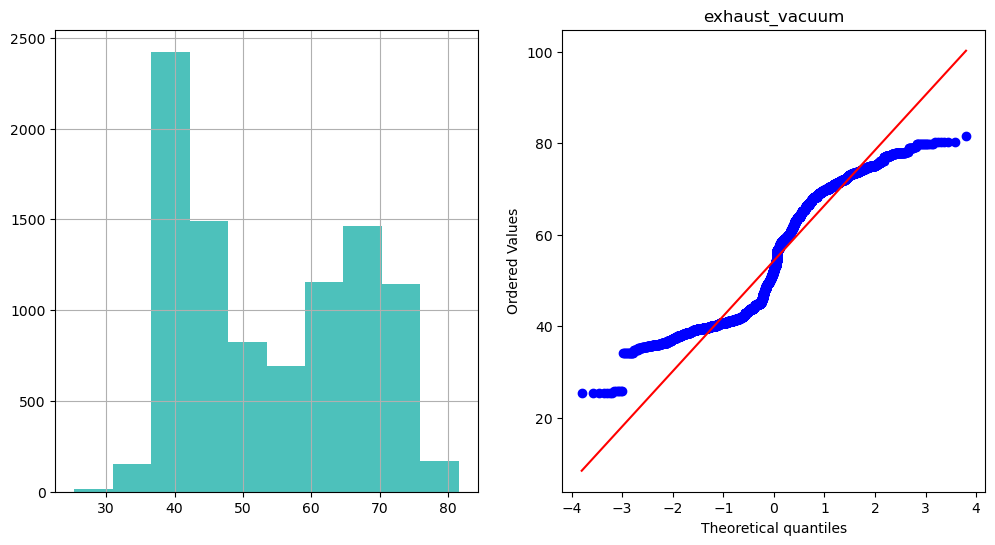

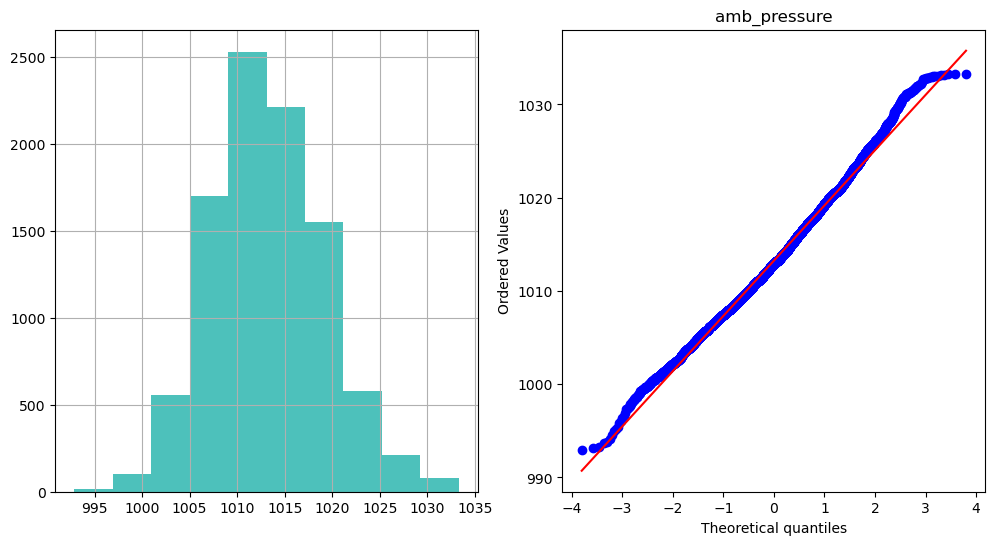

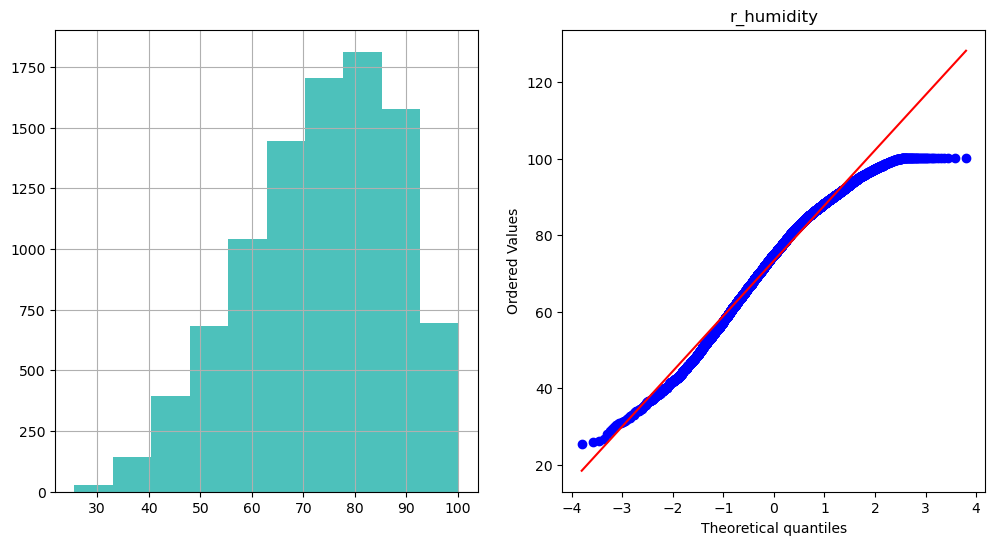

In [13]:
plot_data(Data,'temperature')
plt.title('temperature')
plot_data(Data,'exhaust_vacuum')
plt.title('exhaust_vacuum')
plot_data(Data,'amb_pressure')
plt.title('amb_pressure')
plot_data(Data,'r_humidity')
plt.title('r_humidity')

### The Shapiro-Wilk test

The Shapiro-Wilk test is a test of normality. It is used to determine whether or not a sample comes from a normal distribution.

To perform a Shapiro-Wilk test in Python we can use the scipy.stats.shapiro() function, which takes on the following syntax:

 lets have some Hypothetical test to check the normailty.

In [14]:
from scipy.stats import shapiro

#perform Shapiro-Wilk test
print('temperature feature',shapiro(Data.temperature),'\n'
     'exhaust_vacuum',shapiro(Data.exhaust_vacuum),'\n'
     'amb_pressure',shapiro(Data.amb_pressure),'\n'
     'r_humidity',shapiro(Data.r_humidity),'\n'
     'energy_production',shapiro(Data.energy_production))

temperature feature ShapiroResult(statistic=0.9711723923683167, pvalue=6.842007907881638e-40) 
exhaust_vacuum ShapiroResult(statistic=0.9068190455436707, pvalue=0.0) 
amb_pressure ShapiroResult(statistic=0.9950125813484192, pvalue=1.1658802195566443e-17) 
r_humidity ShapiroResult(statistic=0.9773675799369812, pvalue=2.916315639725132e-36) 
energy_production ShapiroResult(statistic=0.9557409286499023, pvalue=0.0)


So from here data is not perfectly normalised so we will go for feature transformations for that

### Log transformation and visualizing the Histogram to determine any possible changes in distribution

Text(0.5, 1.0, 'energy_production')

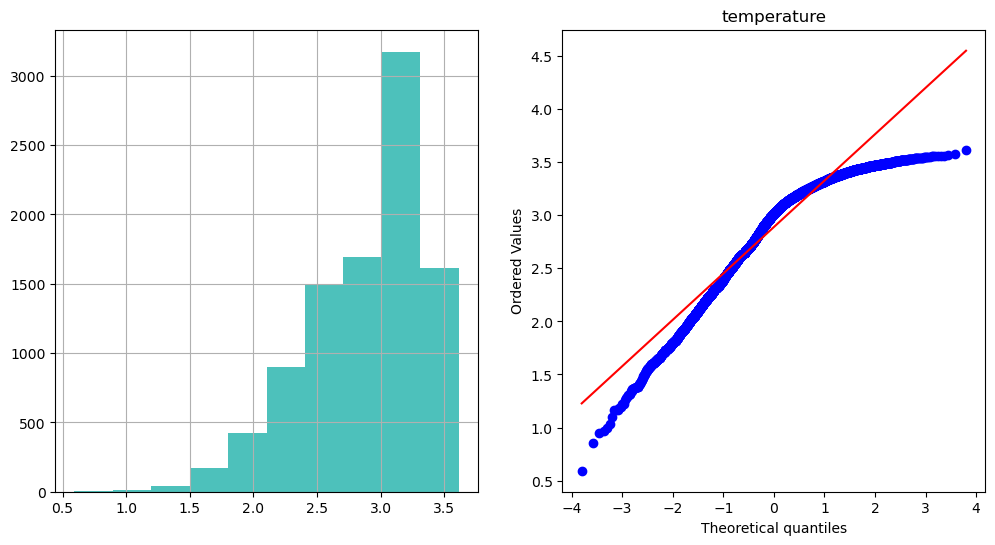

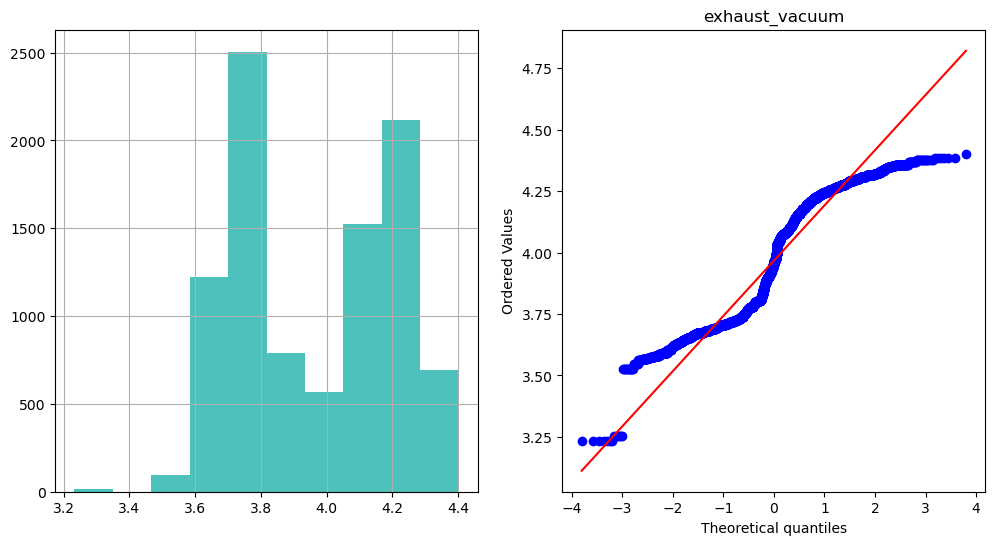

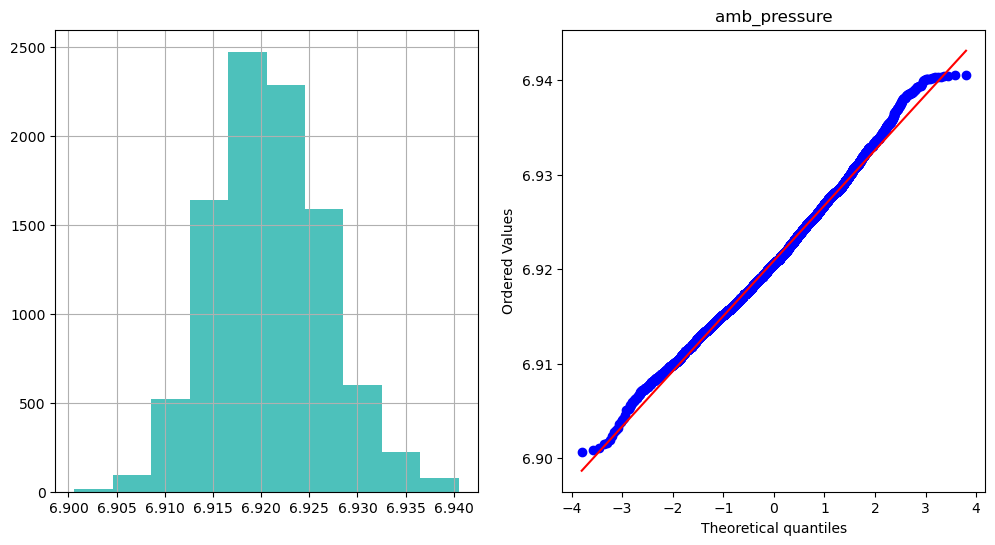

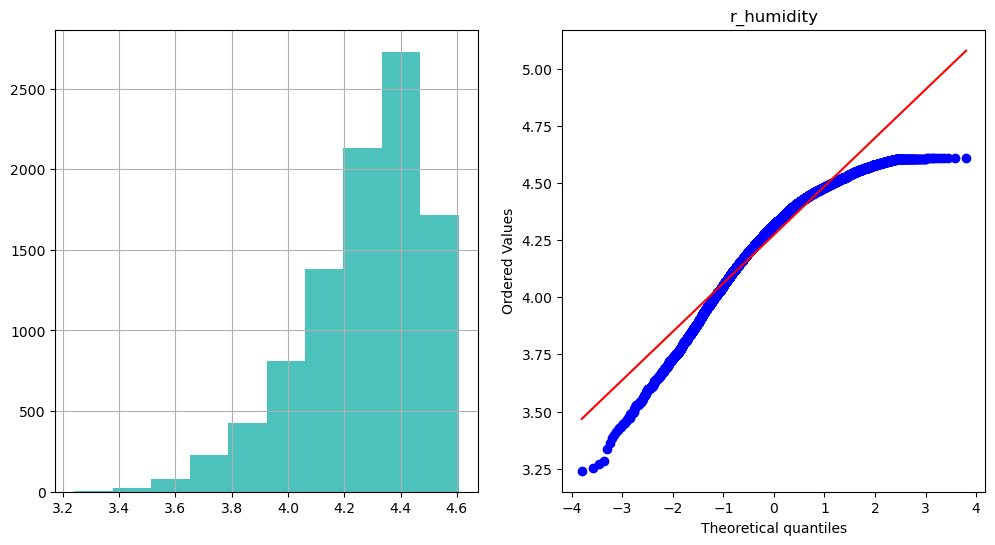

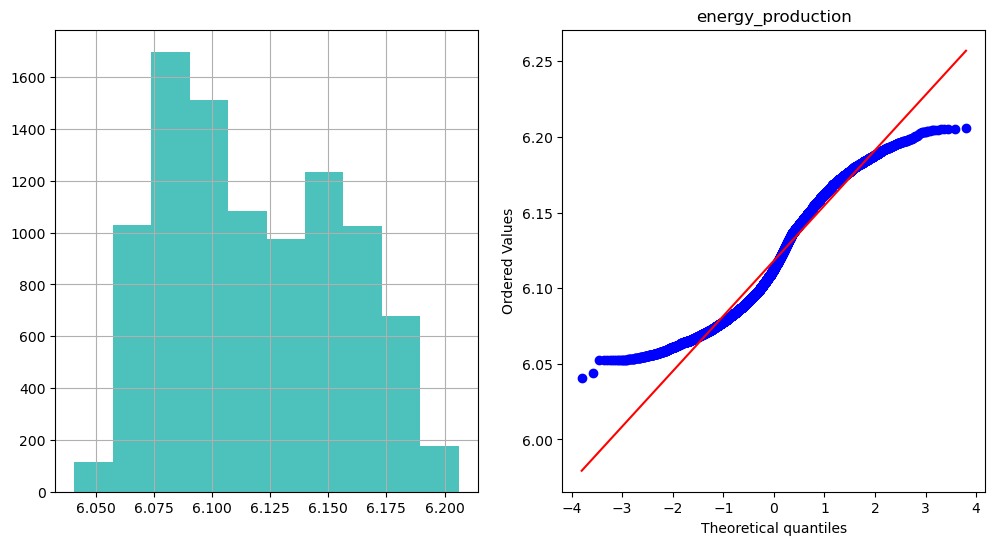

In [15]:
df=Data.copy()
continuous_feature=[feature for feature in df.columns if df[feature].dtype!='O']
df[continuous_feature]=np.log(df[continuous_feature])

plot_data(df,'temperature')
plt.title('temperature')
plot_data(df,'exhaust_vacuum')
plt.title('exhaust_vacuum')
plot_data(df,'amb_pressure')
plt.title('amb_pressure')
plot_data(df,'r_humidity')
plt.title('r_humidity')
plot_data(df,'energy_production')
plt.title('energy_production')

In [16]:
from scipy.stats import shapiro

#perform Shapiro-Wilk test
print('temperature feature',shapiro(df.temperature),'\n'
     'exhaust_vacuum',shapiro(df.exhaust_vacuum),'\n'
     'amb_pressure',shapiro(df.amb_pressure),'\n'
     'r_humidity',shapiro(df.r_humidity),'\n'
     'energy_production',shapiro(df.energy_production))

temperature feature ShapiroResult(statistic=0.9258876442909241, pvalue=0.0) 
exhaust_vacuum ShapiroResult(statistic=0.9111438989639282, pvalue=0.0) 
amb_pressure ShapiroResult(statistic=0.9955434799194336, pvalue=1.4790111113434303e-16) 
r_humidity ShapiroResult(statistic=0.9379411935806274, pvalue=0.0) 
energy_production ShapiroResult(statistic=0.9579640626907349, pvalue=0.0)


### Square root transformation and visualizing the Histogram to determine any possible changes in distribution

Text(0.5, 1.0, 'energy_production')

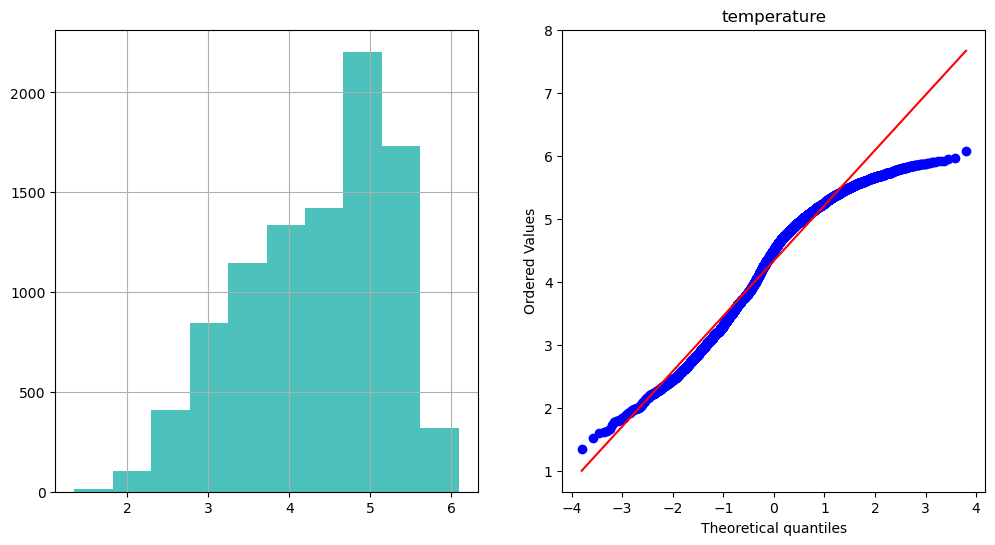

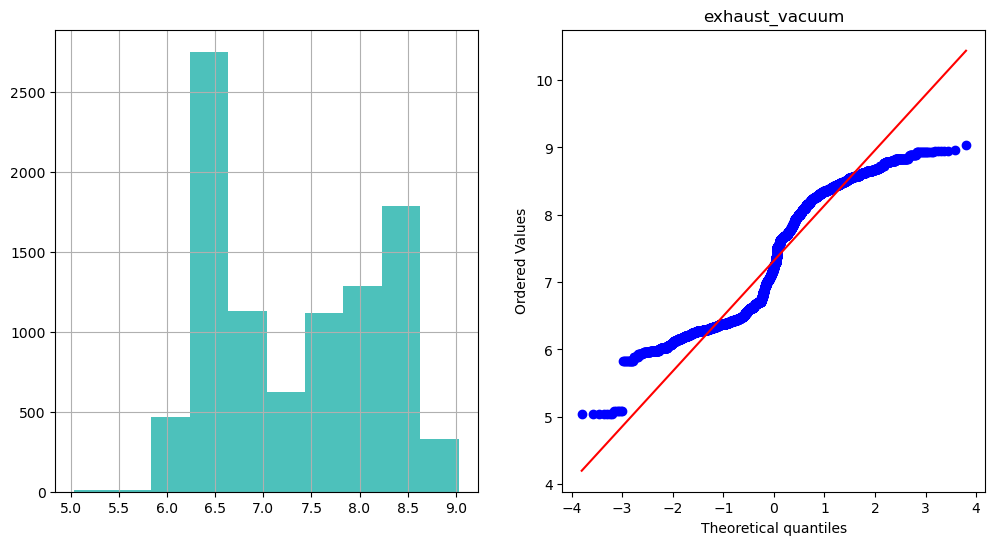

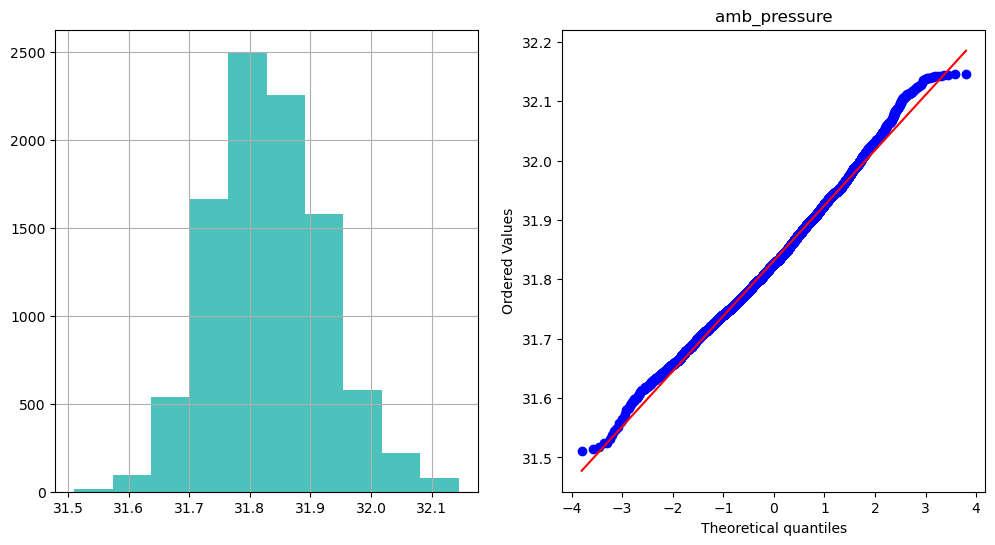

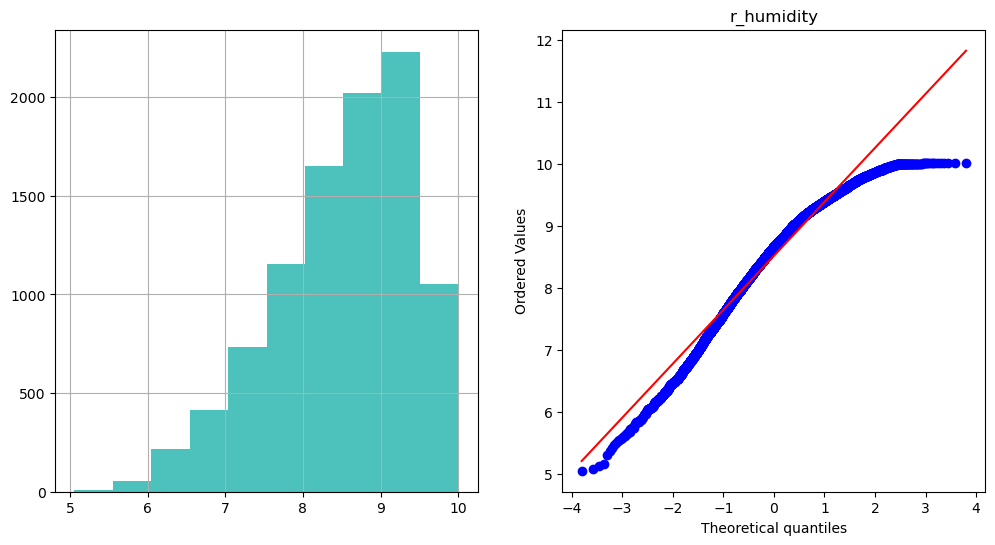

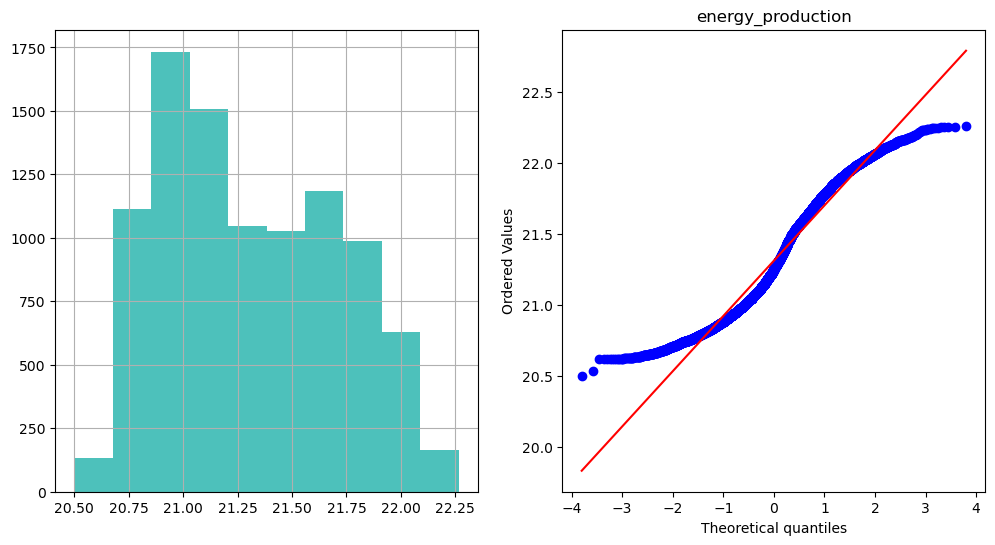

In [17]:
df=Data.copy()
df[continuous_feature]=np.sqrt(df[continuous_feature])

plot_data(df,'temperature')
plt.title('temperature')
plot_data(df,'exhaust_vacuum')
plt.title('exhaust_vacuum')
plot_data(df,'amb_pressure')
plt.title('amb_pressure')
plot_data(df,'r_humidity')
plt.title('r_humidity')
plot_data(df,'energy_production')
plt.title('energy_production')

In [18]:
from scipy.stats import shapiro

#perform Shapiro-Wilk test
print('temperature feature',shapiro(df.temperature),'\n'
     'exhaust_vacuum',shapiro(df.exhaust_vacuum),'\n'
     'amb_pressure',shapiro(df.amb_pressure),'\n'
     'r_humidity',shapiro(df.r_humidity),'\n'
     'energy_production',shapiro(df.energy_production))

temperature feature ShapiroResult(statistic=0.9602512717247009, pvalue=5.605193857299268e-45) 
exhaust_vacuum ShapiroResult(statistic=0.9097551703453064, pvalue=0.0) 
amb_pressure ShapiroResult(statistic=0.9952832460403442, pvalue=4.1539693490877865e-17) 
r_humidity ShapiroResult(statistic=0.9619471430778503, pvalue=2.802596928649634e-44) 
energy_production ShapiroResult(statistic=0.9568983316421509, pvalue=0.0)


### Cuberoot transformation and visualizing the Histogram to determine any possible changes in distribution

Text(0.5, 1.0, 'energy_production')

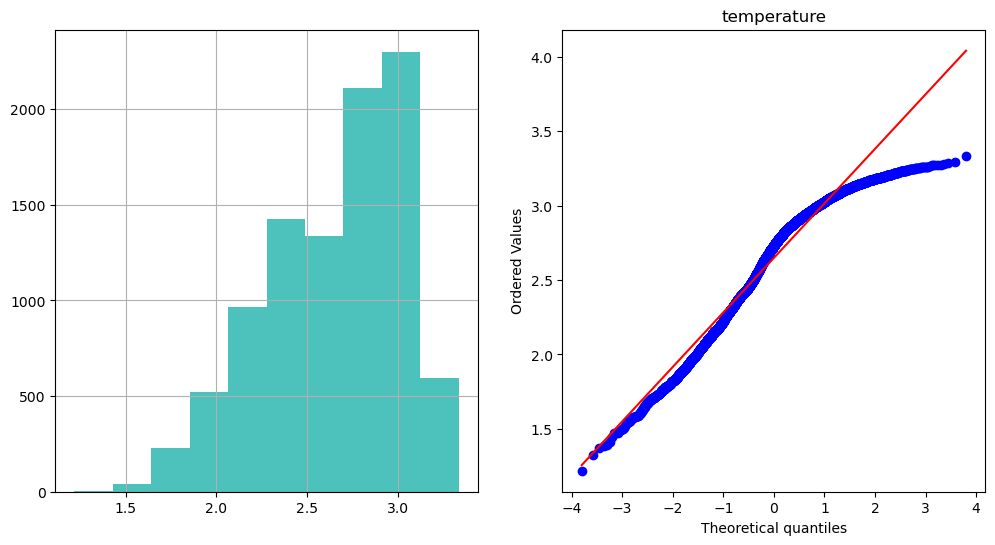

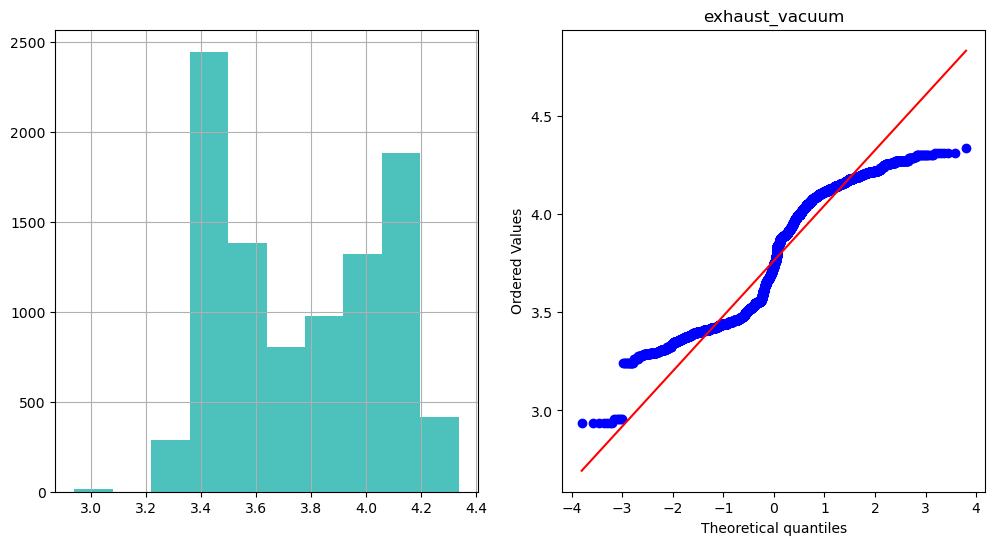

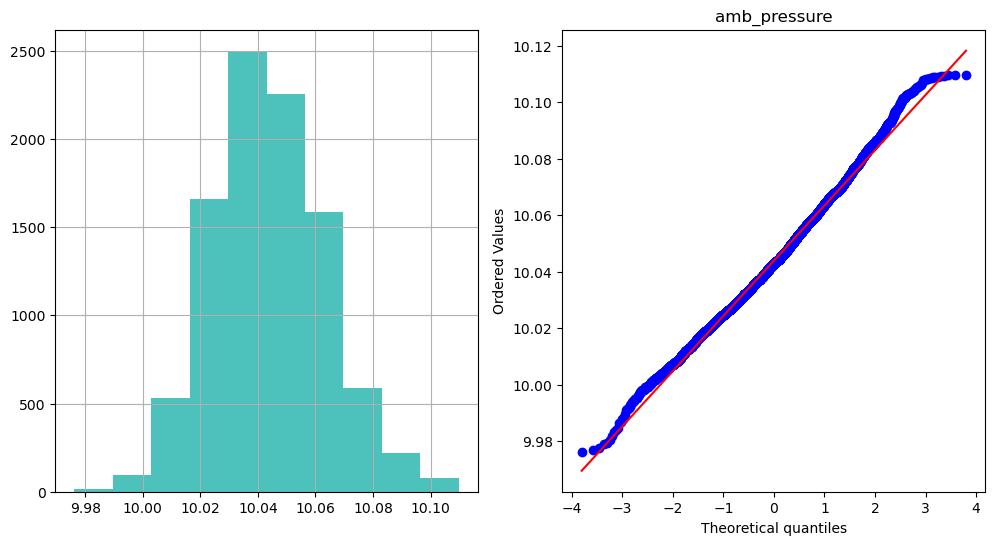

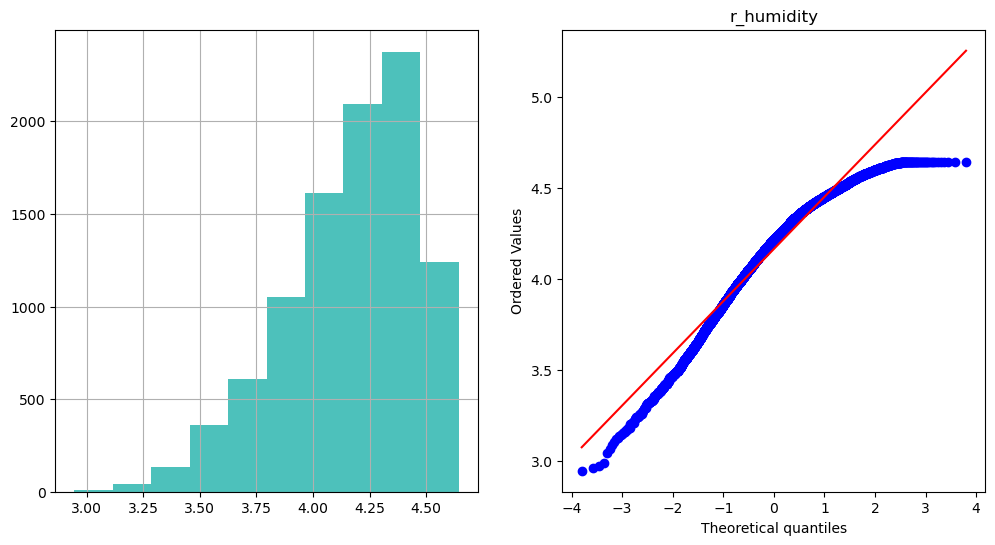

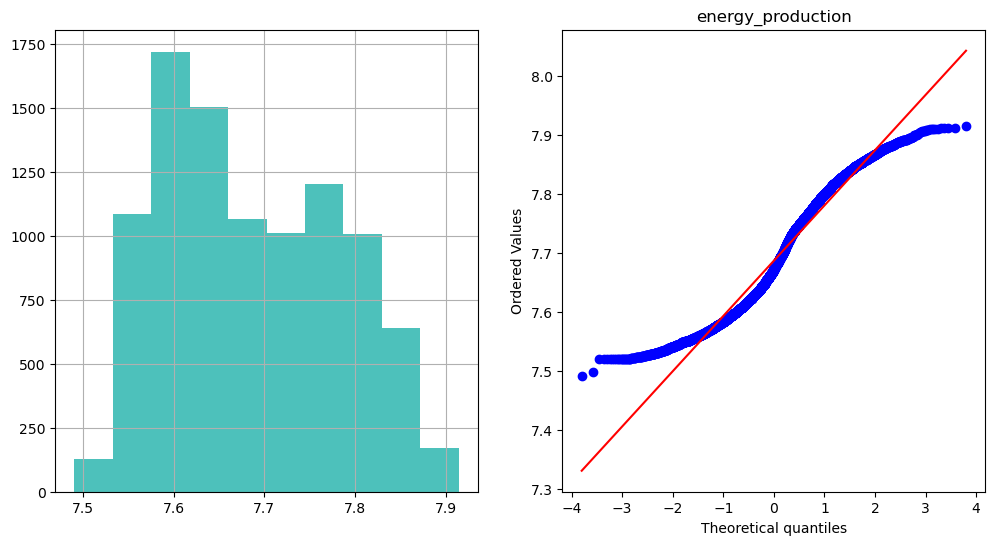

In [19]:
df=Data.copy()
df[continuous_feature]=np.cbrt(df[continuous_feature])

plot_data(df,'temperature')
plt.title('temperature')
plot_data(df,'exhaust_vacuum')
plt.title('exhaust_vacuum')
plot_data(df,'amb_pressure')
plt.title('amb_pressure')
plot_data(df,'r_humidity')
plt.title('r_humidity')
plot_data(df,'energy_production')
plt.title('energy_production')

In [20]:
from scipy.stats import shapiro

#perform Shapiro-Wilk test
print('temperature feature',shapiro(df.temperature),'\n'
     'exhaust_vacuum',shapiro(df.exhaust_vacuum),'\n'
     'amb_pressure',shapiro(df.amb_pressure),'\n'
     'r_humidity',shapiro(df.r_humidity),'\n'
     'energy_production',shapiro(df.energy_production))

temperature feature ShapiroResult(statistic=0.9518205523490906, pvalue=0.0) 
exhaust_vacuum ShapiroResult(statistic=0.9103964567184448, pvalue=0.0) 
amb_pressure ShapiroResult(statistic=0.9953755736351013, pvalue=6.481669489446297e-17) 
r_humidity ShapiroResult(statistic=0.9549596905708313, pvalue=0.0) 
energy_production ShapiroResult(statistic=0.9572696685791016, pvalue=0.0)


### Boxcox Transformations

In [21]:
from scipy import stats

Text(0.5, 1.0, 'energy_production')

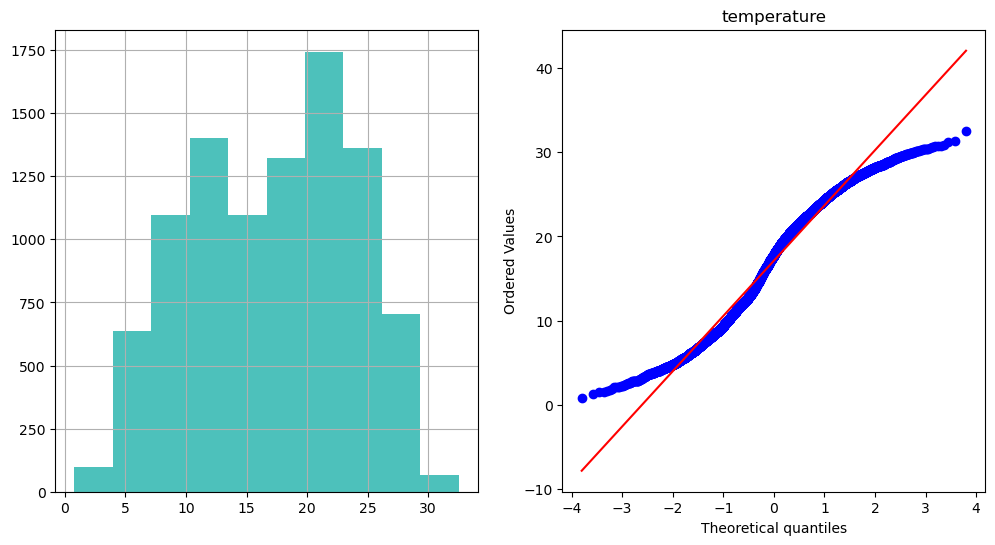

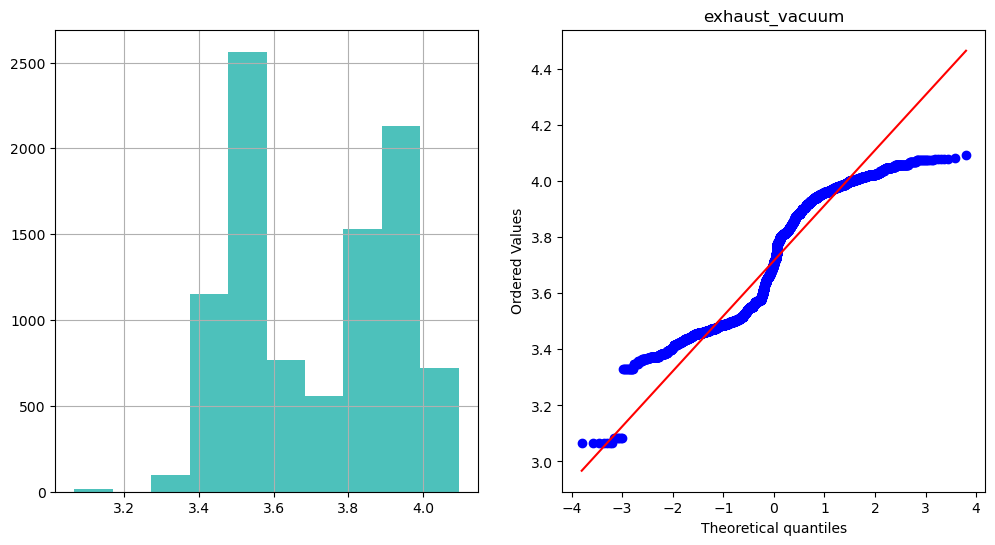

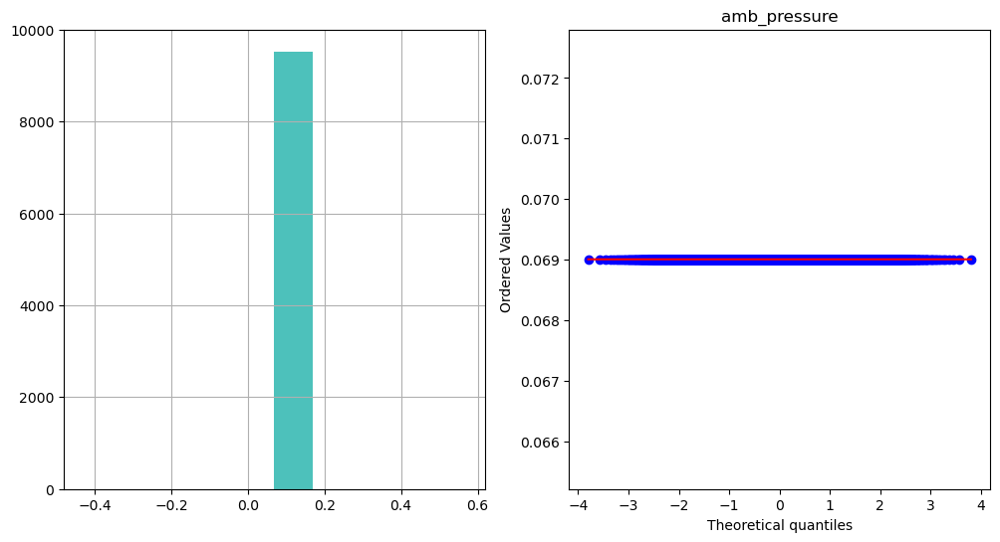

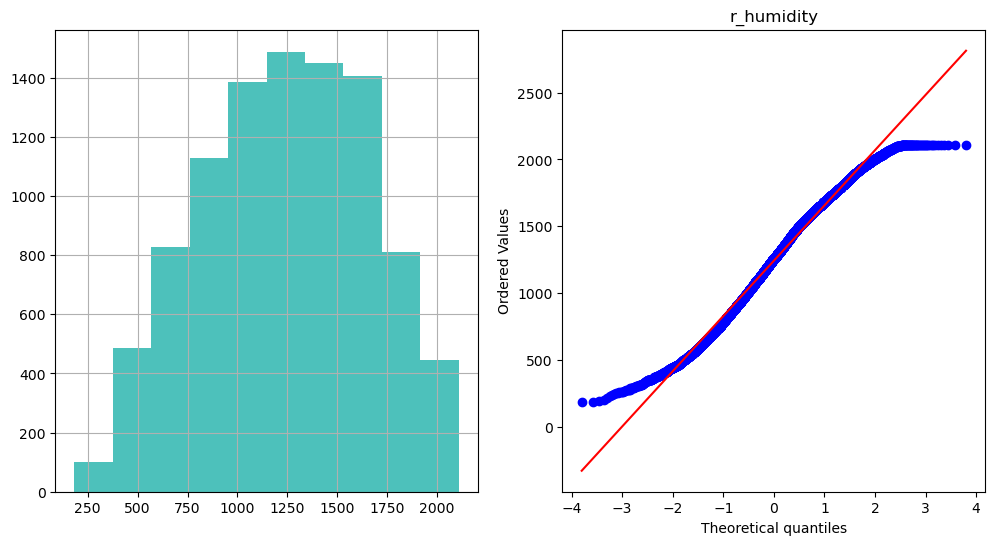

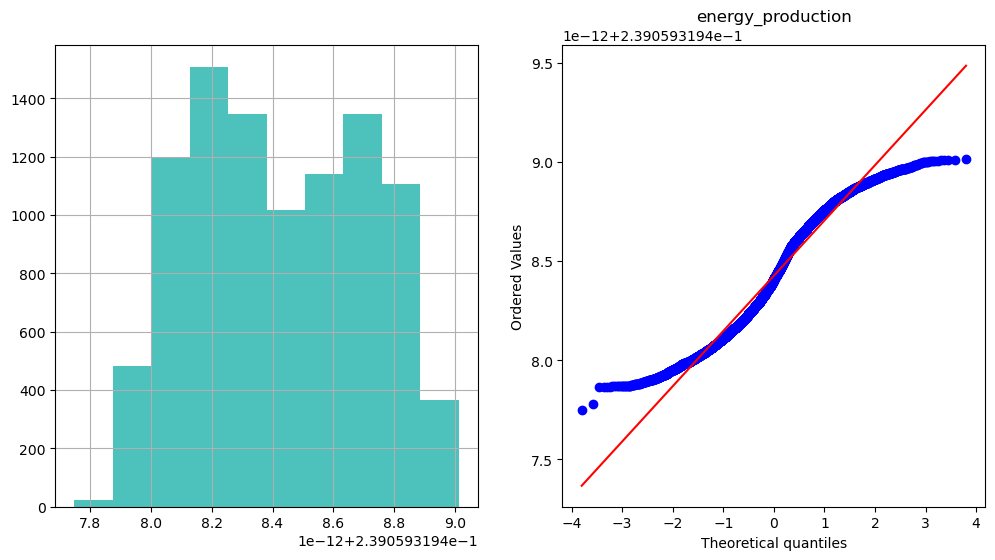

In [22]:
df=Data.copy()
epsilon = 1e-10  # A small constant to avoid zero values
for feature in continuous_feature:
    min_value = df[feature].min()
    if min_value <= 0:
        df[feature] = df[feature] - min_value + epsilon

# Apply Box-Cox transformation
for feature in continuous_feature:
    df[feature], _ = stats.boxcox(df[feature])

plot_data(df,'temperature')
plt.title('temperature')
plot_data(df,'exhaust_vacuum')
plt.title('exhaust_vacuum')
plot_data(df,'amb_pressure')
plt.title('amb_pressure')
plot_data(df,'r_humidity')
plt.title('r_humidity')
plot_data(df,'energy_production')
plt.title('energy_production')

In [23]:
from scipy.stats import shapiro

#perform Shapiro-Wilk test
print('temperature feature',shapiro(df.temperature),'\n'
     'exhaust_vacuum',shapiro(df.exhaust_vacuum),'\n'
     'amb_pressure',shapiro(df.amb_pressure),'\n'
     'r_humidity',shapiro(df.r_humidity),'\n'
     'energy_production',shapiro(df.energy_production))

temperature feature ShapiroResult(statistic=0.9709867835044861, pvalue=5.45075675354603e-40) 
exhaust_vacuum ShapiroResult(statistic=0.9111804962158203, pvalue=0.0) 
amb_pressure ShapiroResult(statistic=1.0, pvalue=1.0) 
r_humidity ShapiroResult(statistic=0.9869776964187622, pvalue=1.1999409018301238e-28) 
energy_production ShapiroResult(statistic=0.9629256129264832, pvalue=7.42688186092153e-44)


Ohk vivek we done with feature transformations to check normal distribution behaviour of our dataset.....

Note: Most of the Continuous Features visually do not look normally distributed.

Observation: Since the p-values are less than .05, we reject the null hypothesis.
We have sufficient evidence to say that the sample data does not come from a normal distribution.

### Visualizing the Relation between each independent Feature with respect to the Dependent Feature

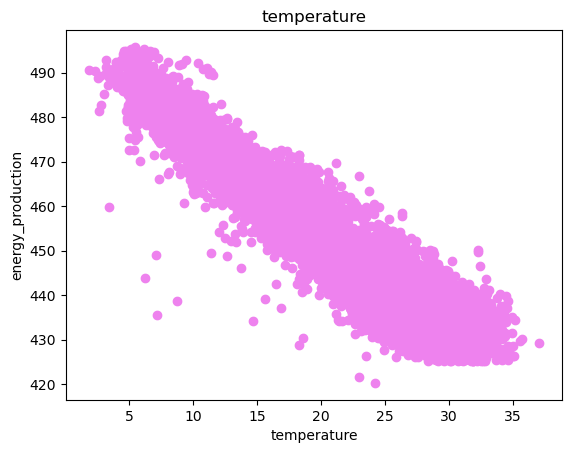

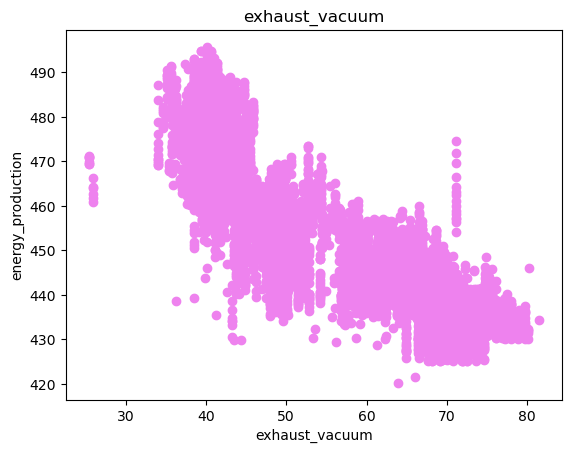

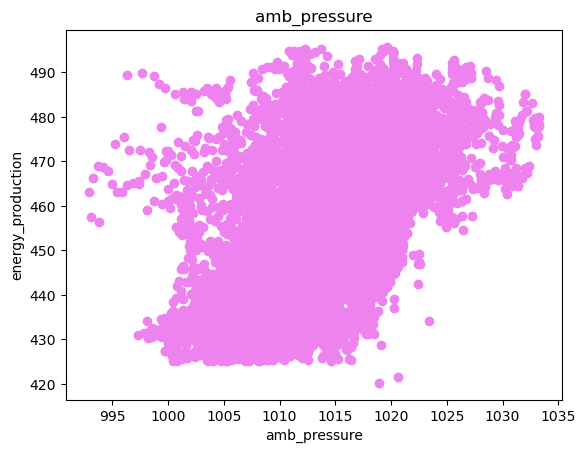

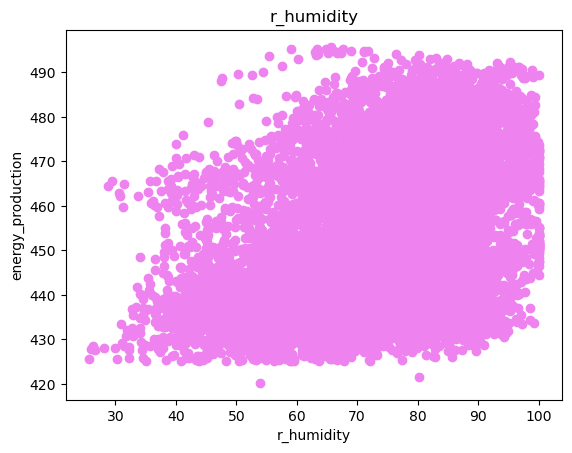

In [24]:
for feature in continuous_feature:
    if feature!="energy_production":
        df=Data.copy()

        plt.scatter(df[feature],df['energy_production'],color='violet')
        plt.xlabel(feature)
        plt.ylabel('energy_production')
        plt.title(feature)
        plt.show()

Observation: temprature feature has a good linear relation with energy production a Negative Correlation as compare to other features

### Visualizing Continuous Datatype for Outlier Detection

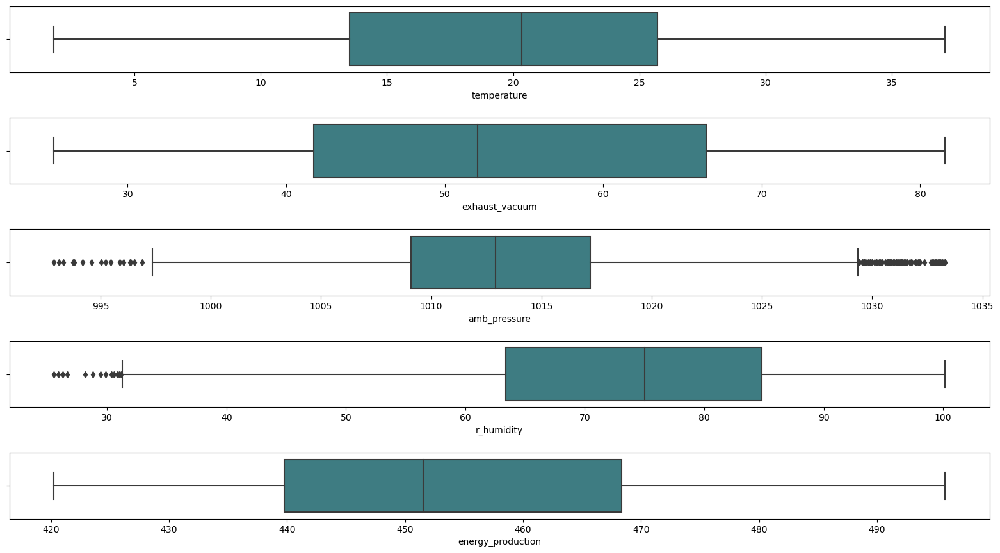

In [25]:
df=Data.copy()
fig, axes=plt.subplots(5,1,figsize=(16,9),sharex=False,sharey=False)
sns.boxplot(x='temperature',data=df,palette='crest',ax=axes[0])
sns.boxplot(x='exhaust_vacuum',data=df,palette='crest',ax=axes[1])
sns.boxplot(x='amb_pressure',data=df,palette='crest',ax=axes[2])
sns.boxplot(x='r_humidity',data=df,palette='crest',ax=axes[3])
sns.boxplot(x='energy_production',data=df,palette='crest',ax=axes[4])
plt.tight_layout(pad=2.0)

Observation: A significant amount of outliers are present in r_humidity,amb_pressure
Note:

We can't simply remove the outliers that would mean loss of information
We need to try different types of transformation or imputation and select the one with the best results
Note: Transforming variables can also eliminate outliers. The Transformed Variables reduces the variation caused by thr extreme values
Before handling Outliers lets build a model and compare its R-squared value with other techniques to see which technique suits best for out case
Let's try Median Imputation to handle Outlier in r_humiditya and amb_pressure

### Median Imputation to handle Outlier in r_humiditya and amb_pressure

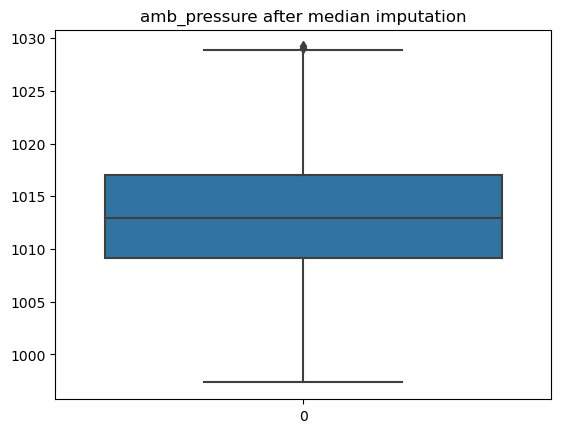

In [26]:
df1=Data.copy()
for i in Data['amb_pressure']:
    q1 = np.quantile(df1.amb_pressure,0.25)
    q3 = np.quantile(df1.amb_pressure,0.75)
    med = np.median(df1.amb_pressure)
    iqr = q3 - q1
    upper_bound = q3+(1.5*iqr)
    lower_bound = q1-(1.5*iqr)
    if i > upper_bound or i < lower_bound:
        df1['amb_pressure'] = df1['amb_pressure'].replace(i, np.median(df1['amb_pressure']))
sns.boxplot(df1['amb_pressure'])
plt.title('amb_pressure after median imputation')
plt.show()

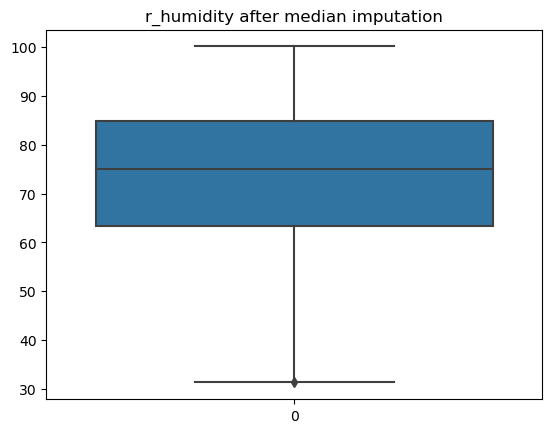

In [27]:
for i in Data['r_humidity']:
    q1 = np.quantile(df1.r_humidity,0.25)
    q3 = np.quantile(df1.r_humidity,0.75)
    med = np.median(df1.r_humidity)
    iqr = q3 - q1
    upper_bound = q3+(1.5*iqr)
    lower_bound = q1-(1.5*iqr)
    if i > upper_bound or i < lower_bound:
        df1['r_humidity'] = df1['r_humidity'].replace(i, np.median(df1['r_humidity']))
sns.boxplot(df1['r_humidity'])
plt.title('r_humidity after median imputation')
plt.show()

Let's test our data in model and find the R-squared with median imputation data model

In [28]:
import statsmodels.formula.api as sm

In [29]:
after_median_imputation_model = sm.ols('energy_production~temperature+exhaust_vacuum+amb_pressure+r_humidity', data = df1).fit()
# Finding rsquared values
after_median_imputation_model.rsquared , after_median_imputation_model.rsquared_adj

(0.9283306733405807, 0.9283005665030847)

### Let's try Mean Imputation to handle Outlier in r_humidity and amb_pressure

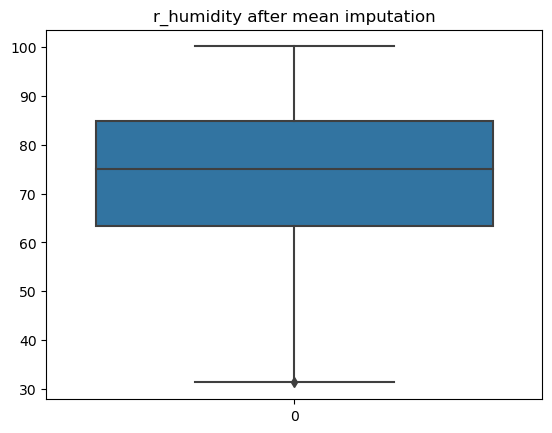

In [30]:
df2=Data.copy()
for i in Data['r_humidity']:
    q1 = np.quantile(df2.r_humidity,0.25)
    q3 = np.quantile(df2.r_humidity,0.75)
    med = np.median(df2.r_humidity)
    iqr = q3 - q1
    upper_bound = q3+(1.5*iqr)
    lower_bound = q1-(1.5*iqr)
    if i > upper_bound or i < lower_bound:
        df2['r_humidity'] = df2['r_humidity'].replace(i, np.mean(df2['r_humidity']))
sns.boxplot(df2['r_humidity'])
plt.title('r_humidity after mean imputation')
plt.show()

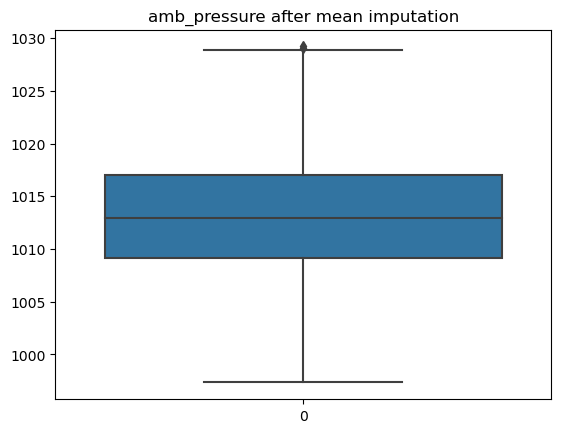

In [31]:
df2=Data.copy()
for i in Data['amb_pressure']:
    q1 = np.quantile(df2.amb_pressure,0.25)
    q3 = np.quantile(df2.amb_pressure,0.75)
    med = np.median(df2.amb_pressure)
    iqr = q3 - q1
    upper_bound = q3+(1.5*iqr)
    lower_bound = q1-(1.5*iqr)
    if i > upper_bound or i < lower_bound:
        df2['amb_pressure'] = df2['amb_pressure'].replace(i, np.mean(df2['amb_pressure']))
sns.boxplot(df2['amb_pressure'])
plt.title('amb_pressure after mean imputation')
plt.show()

### Let's test our data in model and find the R-squared with mean imputation data model

In [32]:
after_mean_imputation_model = sm.ols("energy_production~temperature+exhaust_vacuum+amb_pressure+r_humidity", data = df2).fit()
# Finding rsquared values
after_mean_imputation_model.rsquared , after_mean_imputation_model.rsquared_adj

(0.9285413601097707, 0.9285113417775337)

Observation: As you can see after mean imputation the model is performing well
now we can do is : now to remove the outlier and see the results

In [33]:
df3=Data.copy()
def drop_outliers(data, field_name):
    iqr = 1.5*(np.percentile(data[field_name], 75) - np.percentile(data[field_name], 25))
    data.drop(data[data[field_name] > (iqr + np.percentile(data[field_name], 75))].index, inplace=True)
    data.drop(data[data[field_name] < (np.percentile(data[field_name], 25) - iqr)].index, inplace=True)

Text(0.5, 1.0, 'r_humidity after removing outliers')

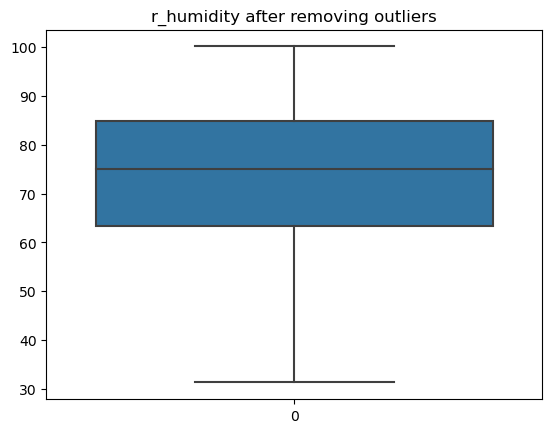

In [34]:
drop_outliers(df3, 'r_humidity')
sns.boxplot(df3.r_humidity)
plt.title('r_humidity after removing outliers')

Text(0.5, 1.0, 'amb_pressure after removing outliers')

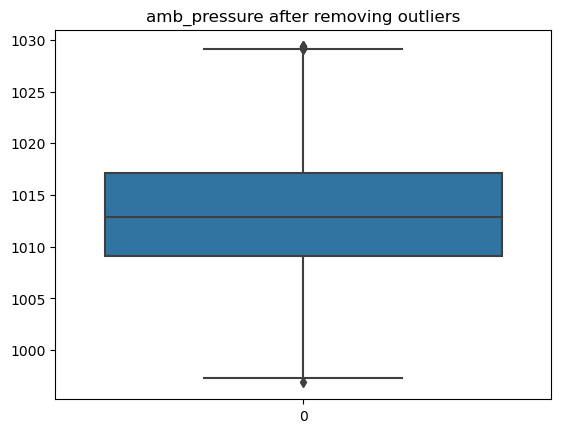

In [35]:
drop_outliers(df3, 'amb_pressure')
sns.boxplot(df3.amb_pressure)
plt.title('amb_pressure after removing outliers')

In [36]:
removed_outlier_model = sm.ols("energy_production~temperature+exhaust_vacuum+amb_pressure+r_humidity", data = df3).fit()
# Finding rsquared values
removed_outlier_model.rsquared , removed_outlier_model.rsquared_adj

(0.9277652938858559, 0.9277346177180614)

In [37]:
np.sqrt(removed_outlier_model.mse_resid)

4.568763181453465

we are geting high r-squred value in mean imputation ,so we will peoceed with that

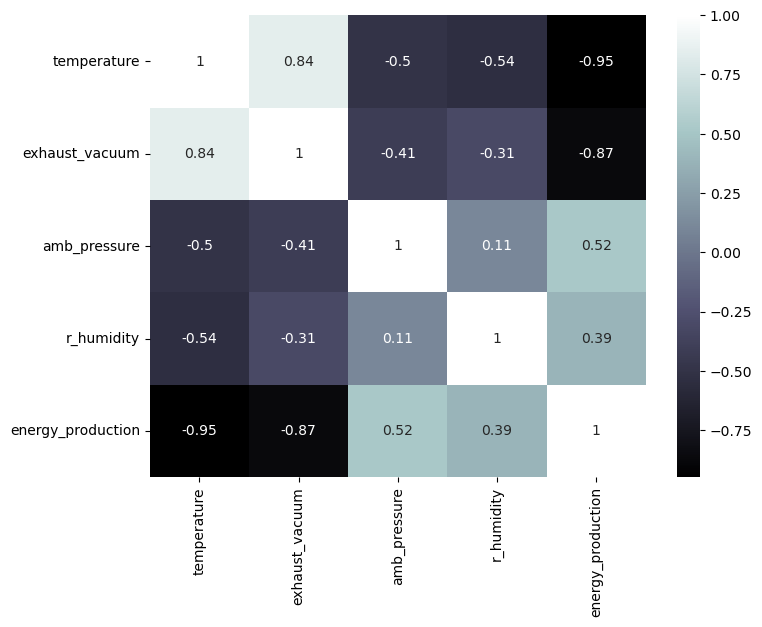

In [38]:
fig = plt.figure(figsize = (8, 6))
sns.heatmap(df2.corr(), annot=True,cmap='bone')
plt.show()

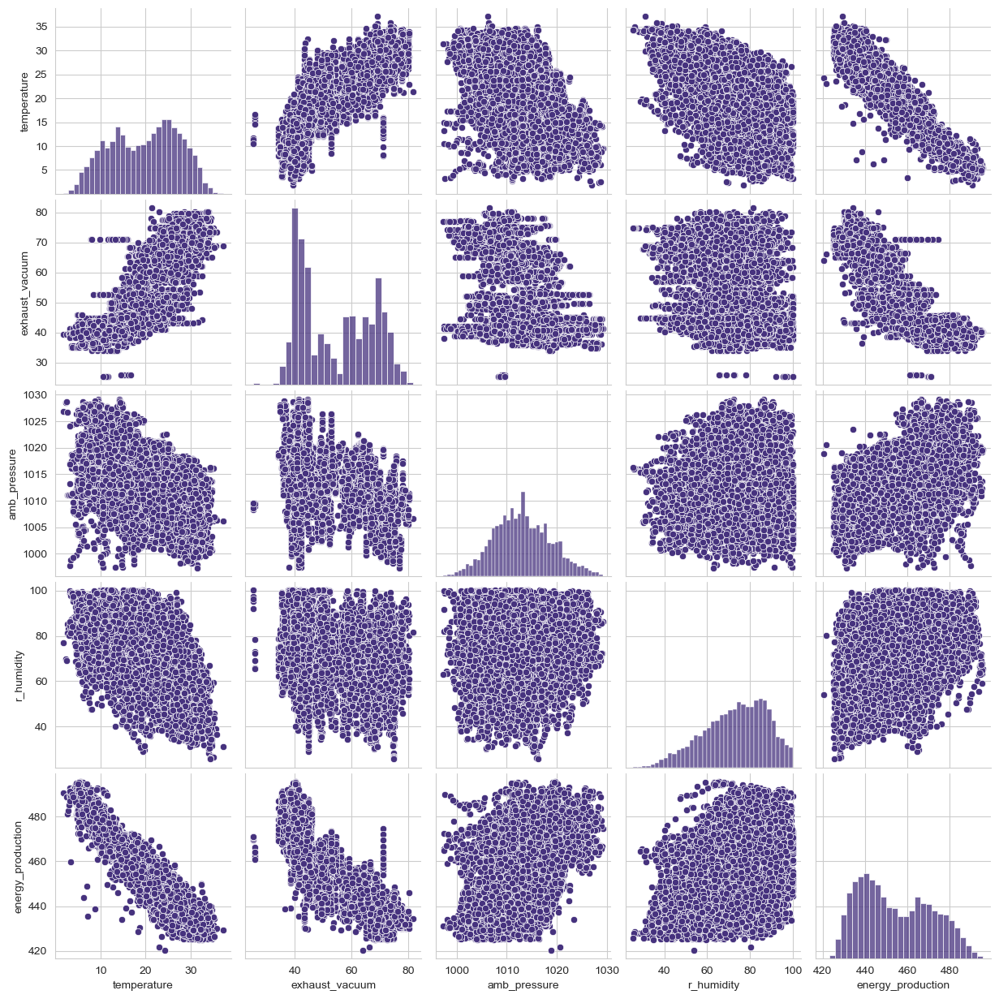

In [39]:
sns.set_palette('viridis')
sns.set_style(style='whitegrid')
sns.pairplot(data=df2)

# Plotly Dash Board

### Train Test split

In [40]:
X=df2.iloc[:,0:4]
Y=df2.iloc[:,4]

In [41]:
X.head(5)

,temperature,exhaust_vacuum,amb_pressure,r_humidity
0,9.59,38.56,1017.01,60.10
1,12.04,42.34,1019.72,94.67
2,13.87,45.08,1024.42,81.69
3,13.72,54.30,1017.89,79.08
4,15.14,49.64,1023.78,75.00


In [42]:
Y.head(5)

0    481.30
1    465.36
2    465.48
3    467.05
4    463.58
Name: energy_production, dtype: float64

In [43]:
from sklearn.model_selection import train_test_split

In [44]:
x_train,x_test,y_train,y_test=train_test_split(X,Y,random_state=42,test_size=0.2)

In [45]:
x_train.head(5)

,temperature,exhaust_vacuum,amb_pressure,r_humidity
5695,20.36,60.10,1011.21,84.79
7300,24.92,60.95,1014.88,60.58
9066,25.90,47.45,1007.80,55.96
6424,20.76,59.21,1017.94,80.84
6773,21.65,58.18,1008.33,95.28


In [46]:
x_test.head(5)

,temperature,exhaust_vacuum,amb_pressure,r_humidity
1087,26.98,70.94,1007.99,68.16
6308,21.37,65.94,1010.73,75.09
8021,19.77,56.65,1020.67,66.33
9483,23.66,69.51,1012.90,52.59
4459,25.44,63.13,1011.74,77.83


In [47]:
y_train.head(5)

5695    454.25
7300    445.44
9066    443.13
6424    447.67
6773    441.05
Name: energy_production, dtype: float64

In [48]:
y_test.head(5)

1087    434.73
6308    444.74
8021    457.09
9483    435.39
4459    441.91
Name: energy_production, dtype: float64

In [49]:
from sklearn.preprocessing import StandardScaler

In [50]:
x_train.head(10)

,temperature,exhaust_vacuum,amb_pressure,r_humidity
5695,20.36,60.10,1011.21,84.79
7300,24.92,60.95,1014.88,60.58
9066,25.90,47.45,1007.80,55.96
6424,20.76,59.21,1017.94,80.84
6773,21.65,58.18,1008.33,95.28
9086,12.12,41.17,1017.68,78.72
6198,17.32,43.70,1015.13,61.66
3429,22.06,43.43,1010.46,58.01
8990,7.61,39.37,1015.84,83.73
3023,16.00,42.86,1013.88,81.74


In [51]:
Train = pd.concat([pd.DataFrame(x_train), y_train], axis=1)

In [52]:
Test=pd.concat([pd.DataFrame(x_test), y_test], axis=1)

# Scaling Data

In [53]:
scale=StandardScaler()

In [54]:
#scale.fit(x_train[columns_to_standardize])
x_train_scaled = scale.fit_transform(x_train)

In [55]:
#scale.fit(x_test[columns_to_standardize])
x_test_scaled = scale.fit_transform(x_test)

In [56]:
y_train_scaled=scale.fit_transform(pd.Series(y_train).values.reshape(-1, 1) )

In [57]:
y_test_scaled=scale.fit_transform(pd.Series(y_test).values.reshape(-1, 1) )

In [58]:
Train_scaled=pd.DataFrame()

In [59]:
Train_scaled[["temperature","exhaust_vacuum","amb_pressure","r_humidity"]]=x_train_scaled

In [60]:
Train_scaled[["energy_production"]]=y_train_scaled

In [61]:
Train_scaled

,temperature,exhaust_vacuum,amb_pressure,r_humidity,energy_production
0,0.091824,0.456521,-0.330916,0.785745,-0.000785
1,0.703155,0.523504,0.319079,-0.865674,-0.518083
2,0.834538,-0.540341,-0.934862,-1.180815,-0.653719
3,0.145450,0.386386,0.861036,0.516307,-0.387144
4,0.264766,0.305218,-0.840993,1.501292,-0.775851
...,...,...,...,...,...
7616,0.255382,1.019964,0.763626,0.390796,-0.476394
7617,-1.518282,-0.902836,-0.463748,1.149999,1.724323
7618,-0.607989,-0.795664,1.220570,0.722308,0.518861
7619,0.280854,-0.951695,-0.008575,-0.397738,0.484218


In [62]:
Test_scaled=pd.DataFrame()

In [63]:
Test_scaled[["temperature","exhaust_vacuum","amb_pressure","r_humidity"]]=x_test_scaled

In [64]:
Test_scaled[["energy_production"]]=y_test_scaled

In [65]:
Test_scaled

,temperature,exhaust_vacuum,amb_pressure,r_humidity,energy_production
0,1.000855,1.318218,-0.927086,-0.377462,-1.165922
1,0.240983,0.923547,-0.445231,0.104171,-0.579326
2,0.024264,0.190248,1.302811,-0.504647,0.144396
3,0.551163,1.205342,-0.063616,-1.459575,-1.127246
4,0.792263,0.701742,-0.267613,0.294601,-0.745167
...,...,...,...,...,...
1901,1.221638,1.224286,-0.605263,-0.131433,-0.826037
1902,1.347606,1.424779,-0.397749,-2.195578,-0.634997
1903,-1.678338,-1.122428,-0.020198,-0.257228,1.518004
1904,0.990019,0.386794,0.513202,-0.188423,-1.082123


# Linear Regression

In [66]:
multilinear_regression_model=sm.ols("energy_production~temperature+exhaust_vacuum+amb_pressure+r_humidity", data = Train_scaled).fit()

In [67]:
multilinear_regression_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:      energy_production   R-squared:                       0.929
Model:                            OLS   Adj. R-squared:                  0.929
Method:                 Least Squares   F-statistic:                 2.474e+04
Date:                Sat, 24 Feb 2024   Prob (F-statistic):               0.00
Time:                        05:29:28   Log-Likelihood:                -759.15
No. Observations:                7621   AIC:                             1528.
Df Residuals:                    7616   BIC:                             1563.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept       4.231e-16      0.003   1.38e-13      1.000      -0.006       0.006
temperature       -0.8627      0.007   -116.576      0.000      -0.877      -0.848
exhaust_vacuum    -0.1745      0.006    -28.891      0.000      -0.186      -0.163
amb_pressure       0.0235      0.004      6.406      0.000       0.016       0.031
r_humidity        -0.1352      0.004    -33.887      0.000      -0.143      -0.127
==============================================================================
Omnibus:                      672.351   Durbin-Watson:                   2.008
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2975.292
Skew:                          -0.332   Prob(JB):                         0.00
Kurtosis:                       5.988   Cond. No.                         4.81
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

R-Squaredvalue high so model perfect but only with r sqrd we cannot finalise the model .F value is very high so we will reject null hypothesis that means all means are equal in ANOVA Test

from above H0:BETA = 0
           Ha:BETA !=0

           but from above if we check P values all features p value is 0.00
           which less than 0.05 so we rejecet null hypothesis and we can tell that all features have less or more influence on Y or Target variable

How can we verify this we can go and verify this

we will check multi collinearity among independent variables

before that we will check feature importances: In linear regression, feature importance is typically inferred from the magnitude of the coefficients assigned to each feature.

In [68]:
np.abs(multilinear_regression_model.params[1:])

temperature       0.862681
exhaust_vacuum    0.174492
amb_pressure      0.023457
r_humidity        0.135249
dtype: float64

these values assume a linear relationship between features and the target variable. If the relationships are nonlinear, other methods like tree-based models or more complex models might provide more accurate feature importance values.

Lets check for multicollinearity:::: 🕵🏿

In [69]:
multilinear_regression_model.pvalues

Intercept          1.000000e+00
temperature        0.000000e+00
exhaust_vacuum    2.954716e-174
amb_pressure       1.583363e-10
r_humidity        1.404943e-234
dtype: float64

In [70]:
Train.corr()

,temperature,exhaust_vacuum,amb_pressure,r_humidity,energy_production
temperature,1.000000,0.842728,-0.498193,-0.543432,-0.947919
exhaust_vacuum,0.842728,1.000000,-0.410426,-0.313406,-0.868738
amb_pressure,-0.498193,-0.410426,1.000000,0.094470,0.512079
r_humidity,-0.543432,-0.313406,0.094470,1.000000,0.390462
energy_production,-0.947919,-0.868738,0.512079,0.390462,1.000000


In [71]:
modelT=sm.ols("energy_production~temperature", data = Train_scaled).fit()
modelT.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:      energy_production   R-squared:                       0.899
Model:                            OLS   Adj. R-squared:                  0.899
Method:                 Least Squares   F-statistic:                 6.748e+04
Date:                Sat, 24 Feb 2024   Prob (F-statistic):               0.00
Time:                        05:29:28   Log-Likelihood:                -2094.6
No. Observations:                7621   AIC:                             4193.
Df Residuals:                    7619   BIC:                             4207.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept    4.231e-16      0.004   1.16e-13      1.000      -0.007       0.007
temperature    -0.9479      0.004   -259.773      0.000      -0.955      -0.941
==============================================================================
Omnibus:                      291.644   Durbin-Watson:                   2.005
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              731.402
Skew:                          -0.188   Prob(JB):                    1.51e-159
Kurtosis:                       4.470   Cond. No.                         1.00
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [72]:
model2=sm.ols('energy_production~temperature+exhaust_vacuum',data=Train_scaled).fit()
model2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:      energy_production   R-squared:                       0.915
Model:                            OLS   Adj. R-squared:                  0.915
Method:                 Least Squares   F-statistic:                 4.122e+04
Date:                Sat, 24 Feb 2024   Prob (F-statistic):               0.00
Time:                        05:29:28   Log-Likelihood:                -1402.0
No. Observations:                7621   AIC:                             2810.
Df Residuals:                    7618   BIC:                             2831.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept       4.231e-16      0.003   1.27e-13      1.000      -0.007       0.007
temperature       -0.7447      0.006   -120.302      0.000      -0.757      -0.733
exhaust_vacuum    -0.2412      0.006    -38.966      0.000      -0.253      -0.229
==============================================================================
Omnibus:                      386.514   Durbin-Watson:                   2.031
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1246.975
Skew:                          -0.182   Prob(JB):                    1.67e-271
Kurtosis:                       4.948   Cond. No.                         3.42
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [73]:
model3=sm.ols('energy_production~temperature+amb_pressure',data=Train_scaled).fit()
model3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:      energy_production   R-squared:                       0.901
Model:                            OLS   Adj. R-squared:                  0.901
Method:                 Least Squares   F-statistic:                 3.453e+04
Date:                Sat, 24 Feb 2024   Prob (F-statistic):               0.00
Time:                        05:29:28   Log-Likelihood:                -2014.5
No. Observations:                7621   AIC:                             4035.
Df Residuals:                    7618   BIC:                             4056.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept     4.231e-16      0.004   1.17e-13      1.000      -0.007       0.007
temperature     -0.9215      0.004   -221.268      0.000      -0.930      -0.913
amb_pressure     0.0530      0.004     12.721      0.000       0.045       0.061
==============================================================================
Omnibus:                      285.270   Durbin-Watson:                   2.007
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              713.859
Skew:                          -0.182   Prob(JB):                    9.71e-156
Kurtosis:                       4.455   Cond. No.                         1.73
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [74]:
model4=sm.ols('energy_production~temperature+exhaust_vacuum+amb_pressure+r_humidity',data=Train_scaled).fit()
model4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:      energy_production   R-squared:                       0.929
Model:                            OLS   Adj. R-squared:                  0.929
Method:                 Least Squares   F-statistic:                 2.474e+04
Date:                Sat, 24 Feb 2024   Prob (F-statistic):               0.00
Time:                        05:29:29   Log-Likelihood:                -759.15
No. Observations:                7621   AIC:                             1528.
Df Residuals:                    7616   BIC:                             1563.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept       4.231e-16      0.003   1.38e-13      1.000      -0.006       0.006
temperature       -0.8627      0.007   -116.576      0.000      -0.877      -0.848
exhaust_vacuum    -0.1745      0.006    -28.891      0.000      -0.186      -0.163
amb_pressure       0.0235      0.004      6.406      0.000       0.016       0.031
r_humidity        -0.1352      0.004    -33.887      0.000      -0.143      -0.127
==============================================================================
Omnibus:                      672.351   Durbin-Watson:                   2.008
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2975.292
Skew:                          -0.332   Prob(JB):                         0.00
Kurtosis:                       5.988   Cond. No.                         4.81
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [75]:
model5=sm.ols('energy_production~exhaust_vacuum',data=Train_scaled).fit()
model5.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:      energy_production   R-squared:                       0.755
Model:                            OLS   Adj. R-squared:                  0.755
Method:                 Least Squares   F-statistic:                 2.344e+04
Date:                Sat, 24 Feb 2024   Prob (F-statistic):               0.00
Time:                        05:29:29   Log-Likelihood:                -5458.8
No. Observations:                7621   AIC:                         1.092e+04
Df Residuals:                    7619   BIC:                         1.094e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept       4.231e-16      0.006   7.46e-14      1.000      -0.011       0.011
exhaust_vacuum    -0.8687      0.006   -153.107      0.000      -0.880      -0.858
==============================================================================
Omnibus:                       76.809   Durbin-Watson:                   2.019
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              115.682
Skew:                          -0.098   Prob(JB):                     7.58e-26
Kurtosis:                       3.571   Cond. No.                         1.00
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [76]:
model6=sm.ols('energy_production~r_humidity',data=Train_scaled).fit()
model6.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:      energy_production   R-squared:                       0.152
Model:                            OLS   Adj. R-squared:                  0.152
Method:                 Least Squares   F-statistic:                     1371.
Date:                Sat, 24 Feb 2024   Prob (F-statistic):          4.94e-276
Time:                        05:29:29   Log-Likelihood:                -10183.
No. Observations:                7621   AIC:                         2.037e+04
Df Residuals:                    7619   BIC:                         2.038e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   4.231e-16      0.011   4.01e-14      1.000      -0.021       0.021
r_humidity     0.3905      0.011     37.021      0.000       0.370       0.411
==============================================================================
Omnibus:                      595.564   Durbin-Watson:                   2.021
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              250.358
Skew:                           0.231   Prob(JB):                     4.32e-55
Kurtosis:                       2.241   Cond. No.                         1.00
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [77]:
model7=sm.ols('energy_production~amb_pressure',data=Train_scaled).fit()
model7.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:      energy_production   R-squared:                       0.262
Model:                            OLS   Adj. R-squared:                  0.262
Method:                 Least Squares   F-statistic:                     2708.
Date:                Sat, 24 Feb 2024   Prob (F-statistic):               0.00
Time:                        05:29:29   Log-Likelihood:                -9654.9
No. Observations:                7621   AIC:                         1.931e+04
Df Residuals:                    7619   BIC:                         1.933e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
================================================================================
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
Intercept     4.231e-16      0.010    4.3e-14      1.000      -0.019       0.019
amb_pressure     0.5121      0.010     52.038      0.000       0.493       0.531
==============================================================================
Omnibus:                      404.393   Durbin-Watson:                   2.028
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              466.183
Skew:                           0.600   Prob(JB):                    5.88e-102
Kurtosis:                       2.826   Cond. No.                         1.00
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

So from above if we check each features individual impact on Target variable r_humidity and amb_pressure havae less rsqrd value as shown in above summary Compared to when we are using with other features

based on R2 value we cannot fully finalise the multicollinearity and we cannot drop low performing features...so let us go for VIF

## Calculating VIF

In [78]:
rsq_t = sm.ols('temperature~exhaust_vacuum+amb_pressure+r_humidity',data=Train_scaled).fit().rsquared
vif_t= 1/(1-rsq_t)

rsq_v = sm.ols('exhaust_vacuum~temperature+amb_pressure+r_humidity',data=Train_scaled).fit().rsquared
vif_v= 1/(1-rsq_v)

rsq_a = sm.ols('amb_pressure~temperature+exhaust_vacuum+r_humidity',data=Train_scaled).fit().rsquared
vif_a= 1/(1-rsq_a)

rsq_h = sm.ols('r_humidity~temperature+exhaust_vacuum+amb_pressure',data=Train_scaled).fit().rsquared
vif_h= 1/(1-rsq_h)


d1 = {'Variables':['temperature','exhaust_vacuum','amb_pressure','r_humidity'],
      'VIF':[vif_t,vif_v,vif_a,vif_h]}
Vif_frame = pd.DataFrame(d1).sort_values('VIF',ascending=False)
Vif_frame

,Variables,VIF
0,temperature,5.836580
1,exhaust_vacuum,3.887745
3,r_humidity,1.697797
2,amb_pressure,1.429123


Generally VIF should be less than 5 or 10

so no need to drop any features since VIF for all X's is fine..👾

## Residual Analysis

Conditions of Residuals in good linear Regression model:

1.)Mean value of residuals = 0

2.)Constant variance

   ---Homoscadacity

   ---Errors are normally distributed

   ---Should not be anyn pattern in residual should be randomly distributed


In [79]:
multilinear_regression_model.resid

0       0.272123
1       0.055297
2      -0.165840
3      -0.144613
4      -0.271408
          ...   
7616   -0.043162
7617    0.423406
7618   -0.075417
7619    0.506850
7620    0.402061
Length: 7621, dtype: float64

### Test of normality of residuals

In [80]:
import statsmodels.api as sma

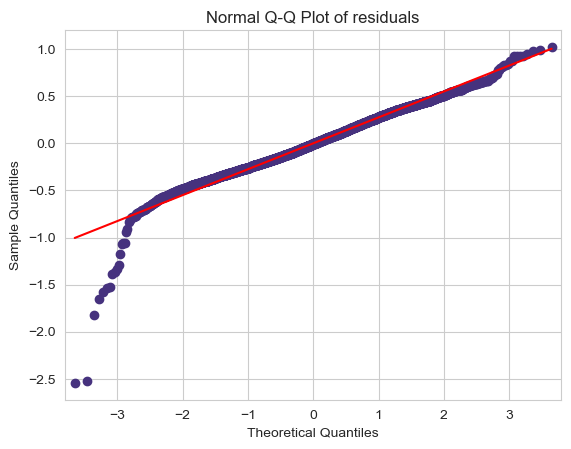

In [81]:
qqplot=sma.qqplot(multilinear_regression_model.resid,line='q')
plt.title("Normal Q-Q Plot of residuals")
plt.show()

Text(0.5, 1.0, 'Normal distribution of residuals')

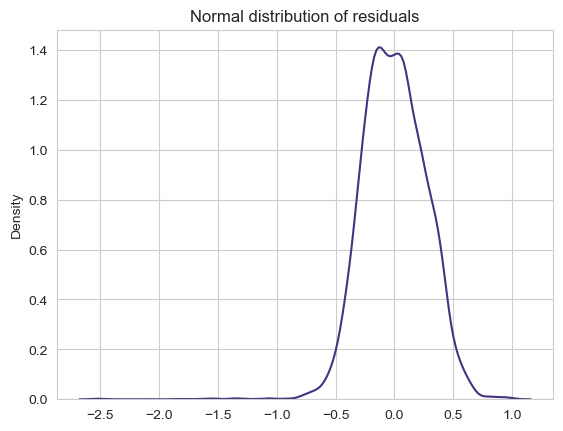

In [82]:
sns.kdeplot(multilinear_regression_model.resid)
plt.title("Normal distribution of residuals")

There is slight deviation in Q-Q plot but for majority of the points its follow the straight line and we can say its reasonably normally distributed

### Residual Plot for Homoscedasticity

In [83]:
#def get_standardized_values( vals ):
  #  return (vals - vals.mean())/vals.std()

In [84]:
#plt.scatter(get_standardized_values(multilinear_regression_model.fittedvalues),
 #           get_standardized_values(multilinear_regression_model.resid))

#plt.title('Residual Plot')
#plt.xlabel('Standardized Fitted values')
#plt.ylabel('Standardized residual values')
#plt.show()

So except some negative fluctuations majority of datas are Following homoscadacity since no Funnal shape graph present here

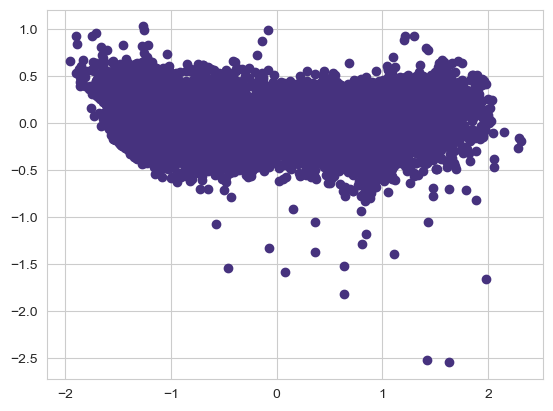

In [85]:
plt.scatter(multilinear_regression_model.fittedvalues,
            multilinear_regression_model.resid)

In [86]:
list(np.where(multilinear_regression_model.resid>0.75))

[array([ 453,  556, 1159, 2086, 3368, 3783, 4023, 4187, 4424, 4468, 4669,
        4707, 5161, 5404, 6018, 6523, 6825, 7317])]

In [87]:
list(np.where(multilinear_regression_model.resid<-0.75))

[array([ 101,  470,  887,  962, 1081, 1094, 1548, 1680, 2035, 2148, 2314,
        3348, 3560, 3887, 4496, 4636, 4775, 5266, 5548, 5681, 5774, 6556,
        6666, 6840, 7159, 7375])]

from above we can see that where and all we can see that error/residual is more so we will give above 15 and less than -15 based on residauls of each entries
but when i re run this code after standardising data i gave above 0.75 and below -0.75 values.

### Residual Vs Regressors

This from following plots first graph explains helps us how each feature related to error

In [88]:
Train.head(1)

,temperature,exhaust_vacuum,amb_pressure,r_humidity,energy_production
5695,20.36,60.1,1011.21,84.79,454.25


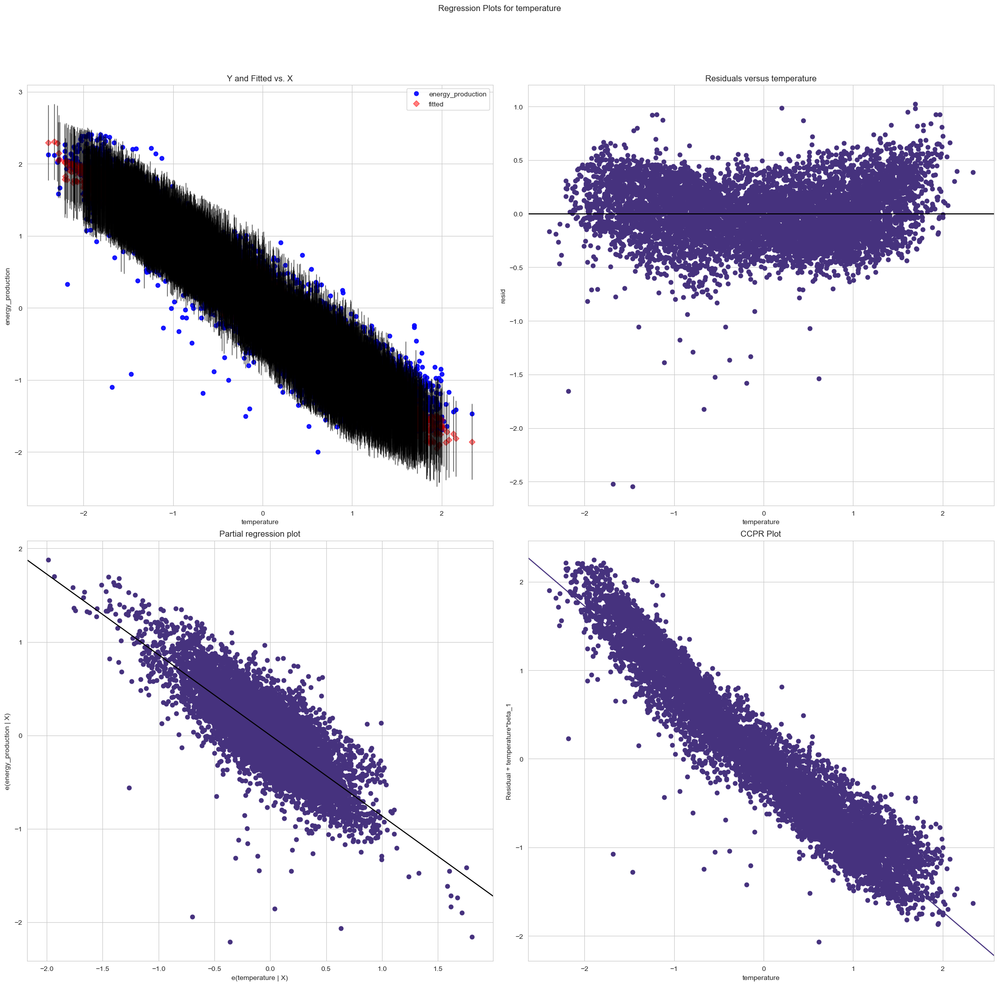

In [89]:
fig = plt.figure(figsize=(20,20))
fig = sma.graphics.plot_regress_exog(multilinear_regression_model, "temperature", fig=fig)
plt.show()

From partial regression plot the plot has reasonable slop so we can conclude that Temperature making good contribution on predicting Y or Target variable.We will do for all following models...

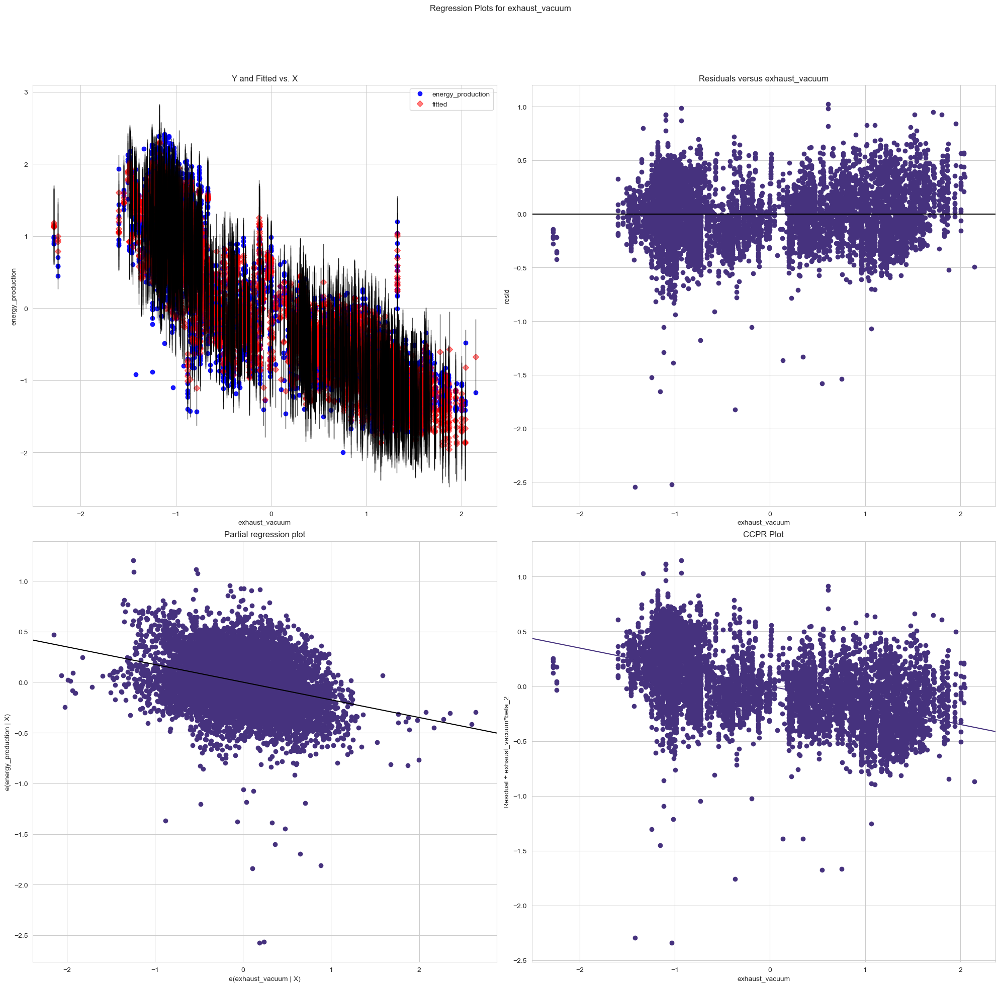

In [90]:
fig = plt.figure(figsize=(20,20))
fig = sma.graphics.plot_regress_exog(multilinear_regression_model, "exhaust_vacuum", fig=fig)
plt.show()

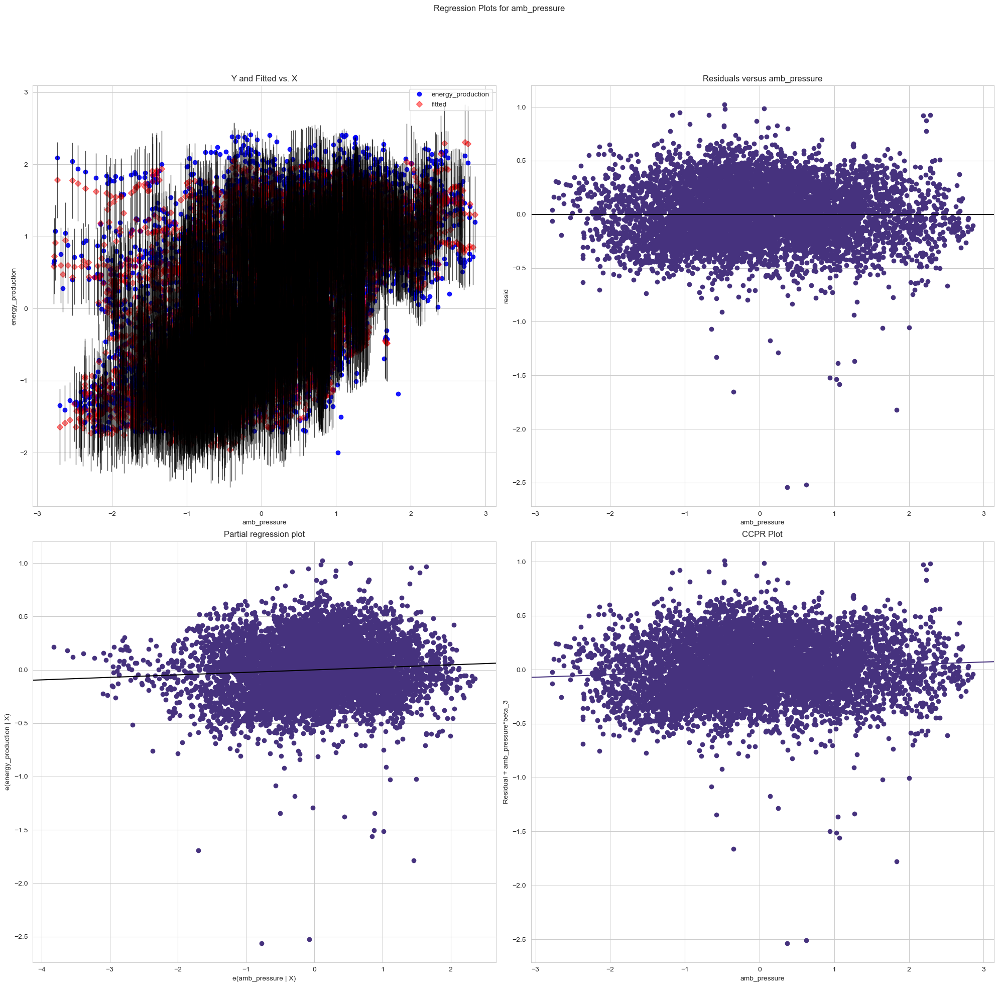

In [91]:
fig = plt.figure(figsize=(20,20))
fig = sma.graphics.plot_regress_exog(multilinear_regression_model, "amb_pressure", fig=fig)
plt.show()

Here ambiant pressure have less slope but still we are getting slope we can tell that it have impact on Energy production

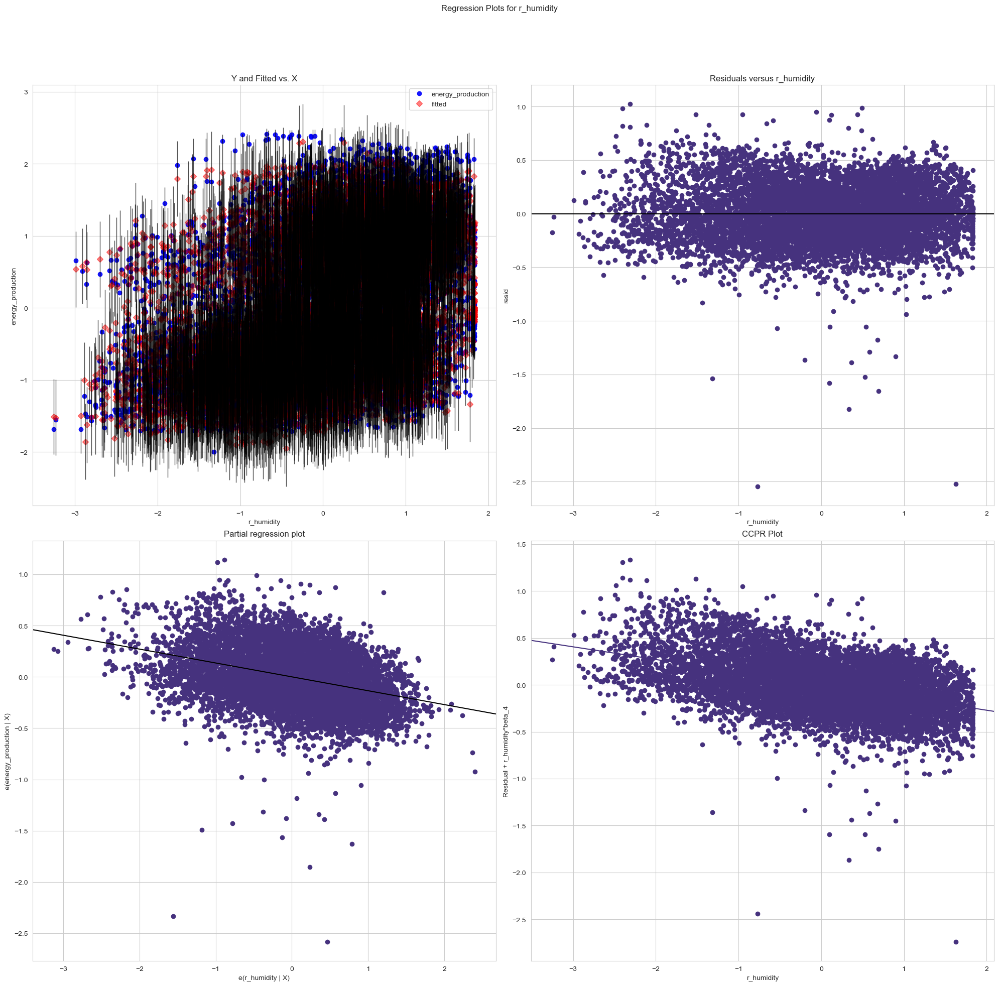

In [92]:
fig = plt.figure(figsize=(20,20))
fig = sma.graphics.plot_regress_exog(multilinear_regression_model, "r_humidity", fig=fig)
plt.show()

So from above all plots we can CONCLUDE THAT ALL X have impact on Energy production.Here from partial_regression_plot we can see that what is the effect of each feature to Energy production

## Detecting Influencers/Outliers

We have analysed residual analysis...So we will check for any influence point or not since we could find some points have high errors (out of +-15)
from previous residual analysis and we will once more recheck is there any outliers there based on the above model.

### Cook’s Distance

Here we will check each rows are high influencial or not it in regression equation or our model .If our beta coeff. changes when we not considering that perticular row in cooks distance calculation process then we can say that perticular data point have influence on our model and need to be removed if it highly influencial.This we can under stand by cooks distance if high cook distance means it have high influence( means > 1 )

In [93]:
model_influence = multilinear_regression_model.get_influence()
(c, _) = model_influence.cooks_distance

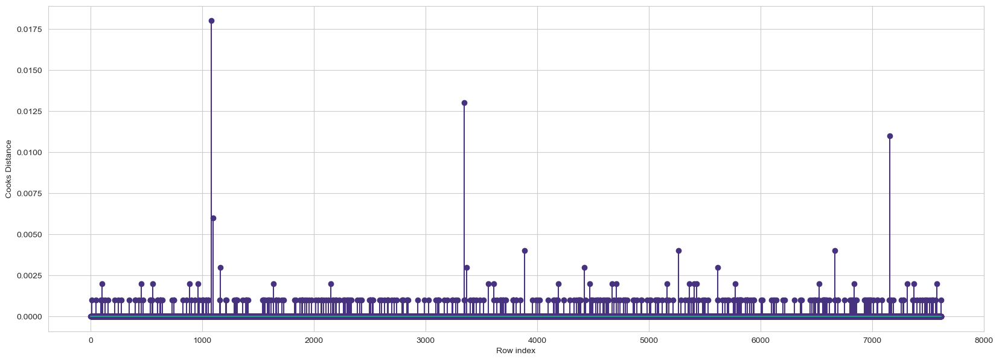

In [94]:
#Plot the influencers values using stem plot
fig = plt.subplots(figsize=(20, 7))
plt.stem(np.arange(len(Train)), np.round(c, 3))
plt.xlabel('Row index')
plt.ylabel('Cooks Distance')
plt.show()

All VALUES OF COOKS DISTANCES ARE LESS THAN ONE SO no much influencial points.

### High influence Points

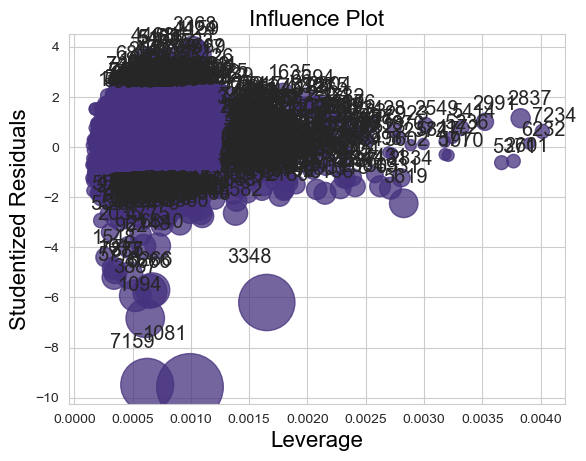

In [95]:
from statsmodels.graphics.regressionplots import influence_plot
influence_plot(multilinear_regression_model)
plt.show()

In [96]:
#k number of variables
k = df2.shape[1]
n = df2.shape[0]
leverage_cutoff = 3*((k + 1)/n)
leverage_cutoff

0.0018893670620342183

In [97]:
high_leverage_indices = np.where(multilinear_regression_model.get_influence().hat_matrix_diag > leverage_cutoff)[0]
high_leverage_indices

array([  28,   98,  416,  571,  658,  779,  903,  970, 1025, 1172, 1263,
       1970, 2123, 2304, 2334, 2372, 2536, 2549, 2601, 2604, 2650, 2671,
       2685, 2834, 2837, 2844, 2923, 2984, 2988, 2991, 3090, 3106, 3284,
       3428, 3473, 3549, 3552, 3623, 3765, 3782, 3856, 3862, 4097, 4183,
       4378, 4423, 4567, 4603, 4687, 4827, 4856, 4860, 4968, 5118, 5176,
       5236, 5371, 5414, 5584, 5602, 5619, 5657, 5723, 5759, 5847, 5928,
       6097, 6118, 6126, 6232, 6303, 6565, 6694, 6741, 6778, 6898, 6931,
       7104, 7234, 7239, 7275, 7401, 7431, 7609])

In [98]:
Train_scaled[Train_scaled.index.isin(high_leverage_indices )]

,temperature,exhaust_vacuum,amb_pressure,r_humidity,energy_production
28,-1.974099,-0.964303,-1.453795,0.519035,1.844106
98,-0.858688,-1.106149,-1.235949,-2.266754,1.151832
416,1.397605,-0.502516,-1.848750,-2.128966,-1.115236
571,-1.811882,-1.168404,-1.457337,-0.927065,1.778343
658,-2.291830,-1.173132,2.763200,-0.289280,2.021432
...,...,...,...,...,...
7239,-1.791772,-0.964303,-1.499843,0.304849,1.703185
7275,-1.755575,-1.121910,0.202186,-1.216285,2.316779
7401,-1.972758,-1.121910,-0.226421,-0.401831,2.377257
7431,1.360068,-0.874467,-0.276012,-0.663766,-1.230321


In [99]:
Train[Train.index.isin(high_leverage_indices )]

,temperature,exhaust_vacuum,amb_pressure,r_humidity,energy_production
6118,7.94,40.60,1015.30,92.14,486.33
1025,23.76,58.82,1011.75,77.34,444.57
1172,31.75,74.99,1003.25,53.33,430.82
2372,25.94,60.75,1007.22,64.76,439.46
2549,27.85,66.44,1008.48,77.15,429.00
...,...,...,...,...,...
4968,26.95,70.80,1009.73,82.95,436.80
6303,18.88,43.69,1016.77,46.88,464.63
98,29.89,71.29,1009.00,55.72,431.45
6694,7.55,41.04,1027.03,83.32,476.58


In [100]:
Train.head(5)

,temperature,exhaust_vacuum,amb_pressure,r_humidity,energy_production
5695,20.36,60.10,1011.21,84.79,454.25
7300,24.92,60.95,1014.88,60.58,445.44
9066,25.90,47.45,1007.80,55.96,443.13
6424,20.76,59.21,1017.94,80.84,447.67
6773,21.65,58.18,1008.33,95.28,441.05


In [101]:
Train_scaled.head(4)

,temperature,exhaust_vacuum,amb_pressure,r_humidity,energy_production
0,0.091824,0.456521,-0.330916,0.785745,-0.000785
1,0.703155,0.523504,0.319079,-0.865674,-0.518083
2,0.834538,-0.540341,-0.934862,-1.180815,-0.653719
3,0.145450,0.386386,0.861036,0.516307,-0.387144


we can see that temperature columns normal values and the influence have some slight difference so we will remove those points.

### Improving the model

In [102]:
#Discard the data points which are influencers and reasign the row number (reset_index())
Train_new=Train.drop(Train.index[high_leverage_indices],axis=0).reset_index()
Train_new

,index,temperature,exhaust_vacuum,amb_pressure,r_humidity,energy_production
0,5695,20.36,60.10,1011.21,84.79,454.25
1,7300,24.92,60.95,1014.88,60.58,445.44
2,9066,25.90,47.45,1007.80,55.96,443.13
3,6424,20.76,59.21,1017.94,80.84,447.67
4,6773,21.65,58.18,1008.33,95.28,441.05
...,...,...,...,...,...,...
7532,5734,21.58,67.25,1017.39,79.00,446.15
7533,5191,8.35,42.85,1010.46,90.13,483.63
7534,5390,15.14,44.21,1019.97,83.86,463.10
7535,860,21.77,42.23,1013.03,67.44,462.51


In [103]:
Train.shape

(7621, 5)

In [104]:
Train_new_scaled=Train_scaled.drop(Train_scaled.index[high_leverage_indices],axis=0).reset_index()
Train_new_scaled

,index,temperature,exhaust_vacuum,amb_pressure,r_humidity,energy_production
0,0,0.091824,0.456521,-0.330916,0.785745,-0.000785
1,1,0.703155,0.523504,0.319079,-0.865674,-0.518083
2,2,0.834538,-0.540341,-0.934862,-1.180815,-0.653719
3,3,0.145450,0.386386,0.861036,0.516307,-0.387144
4,4,0.264766,0.305218,-0.840993,1.501292,-0.775851
...,...,...,...,...,...,...
7532,7616,0.255382,1.019964,0.763626,0.390796,-0.476394
7533,7617,-1.518282,-0.902836,-0.463748,1.149999,1.724323
7534,7618,-0.607989,-0.795664,1.220570,0.722308,0.518861
7535,7619,0.280854,-0.951695,-0.008575,-0.397738,0.484218


In [105]:
multilinear_regression_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:      energy_production   R-squared:                       0.929
Model:                            OLS   Adj. R-squared:                  0.929
Method:                 Least Squares   F-statistic:                 2.474e+04
Date:                Sat, 24 Feb 2024   Prob (F-statistic):               0.00
Time:                        05:29:43   Log-Likelihood:                -759.15
No. Observations:                7621   AIC:                             1528.
Df Residuals:                    7616   BIC:                             1563.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept       4.231e-16      0.003   1.38e-13      1.000      -0.006       0.006
temperature       -0.8627      0.007   -116.576      0.000      -0.877      -0.848
exhaust_vacuum    -0.1745      0.006    -28.891      0.000      -0.186      -0.163
amb_pressure       0.0235      0.004      6.406      0.000       0.016       0.031
r_humidity        -0.1352      0.004    -33.887      0.000      -0.143      -0.127
==============================================================================
Omnibus:                      672.351   Durbin-Watson:                   2.008
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2975.292
Skew:                          -0.332   Prob(JB):                         0.00
Kurtosis:                       5.988   Cond. No.                         4.81
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [106]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

In [107]:
Test_scaled.isnull().sum()

temperature          0
exhaust_vacuum       0
amb_pressure         0
r_humidity           0
energy_production    0
dtype: int64

In [108]:
Test

,temperature,exhaust_vacuum,amb_pressure,r_humidity,energy_production
1087,26.98,70.94,1007.990000,68.16,434.73
6308,21.37,65.94,1010.730000,75.09,444.74
8021,19.77,56.65,1020.670000,66.33,457.09
9483,23.66,69.51,1012.900000,52.59,435.39
4459,25.44,63.13,1011.740000,77.83,441.91
...,...,...,...,...,...
3400,28.61,69.75,1009.820000,71.70,440.53
4210,29.54,72.29,1011.000000,42.00,443.79
7065,7.20,40.02,1013.146891,69.89,480.53
2213,26.90,59.14,1016.180000,70.88,436.16


In [109]:
Test_scaled['predicted_energy'] = multilinear_regression_model.predict(Test_scaled)
mse1 = mean_squared_error(Test_scaled['energy_production'], Test_scaled['predicted_energy'])
rmse1 = np.sqrt(mse1)
mae1 = mean_absolute_error(Test_scaled['energy_production'], Test_scaled['predicted_energy'])
r21 = r2_score(Test_scaled['energy_production'], Test_scaled['predicted_energy'])

print(f"MSE: {mse1}")
print(f"RMSE: {rmse1}")
print(f"MAE: {mae1}")
print(f"R-squared: {r21}")

MSE: 0.0713146192246125
RMSE: 0.26704797176652084
MAE: 0.21292482045774205
R-squared: 0.9286853807753875


In [110]:
model_new=sm.ols("energy_production~temperature+exhaust_vacuum+amb_pressure+r_humidity", data = Train_new_scaled).fit()
model_new.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:      energy_production   R-squared:                       0.927
Model:                            OLS   Adj. R-squared:                  0.927
Method:                 Least Squares   F-statistic:                 2.408e+04
Date:                Sat, 24 Feb 2024   Prob (F-statistic):               0.00
Time:                        05:29:43   Log-Likelihood:                -754.52
No. Observations:                7537   AIC:                             1519.
Df Residuals:                    7532   BIC:                             1554.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
==================================================================================
                     coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------
Intercept         -0.0002      0.003     -0.061      0.951      -0.006       0.006
temperature       -0.8518      0.008   -108.750      0.000      -0.867      -0.836
exhaust_vacuum    -0.1810      0.006    -28.851      0.000      -0.193      -0.169
amb_pressure       0.0266      0.004      6.973      0.000       0.019       0.034
r_humidity        -0.1329      0.004    -32.449      0.000      -0.141      -0.125
==============================================================================
Omnibus:                      663.410   Durbin-Watson:                   2.009
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2928.100
Skew:                          -0.331   Prob(JB):                         0.00
Kurtosis:                       5.981   Cond. No.                         5.06
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [111]:
Test_scaled['predicted_energy_processed_model'] =model_new.predict(Test_scaled)
mse2 = mean_squared_error(Test_scaled['energy_production'], Test_scaled['predicted_energy_processed_model'])
rmse2 = np.sqrt(mse2)
mae2 = mean_absolute_error(Test_scaled['energy_production'],Test_scaled['predicted_energy_processed_model'])
r22 = r2_score(Test_scaled['energy_production'],Test_scaled['predicted_energy_processed_model'])

print(f"MSE: {mse2}")
print(f"RMSE: {rmse2}")
print(f"MAE: {mae2}")
print(f"R-squared: {r22}")

MSE: 0.0712853282401689
RMSE: 0.2669931239567208
MAE: 0.21307904876323788
R-squared: 0.9287146717598311


In [112]:
PREDICTION=pd.DataFrame()

In [113]:
PREDICTION["MLR_Predicted"]=(model_new.predict(Test_scaled)*np.std(y_test))+np.mean(y_test)

In [170]:
# Assuming you have a variable PREDICTION["STACK_Predicted"] that holds the predicted values
print("Predicted values:", PREDICTION["MLR_Predicted"])


Predicted values: 0       436.436700
1       447.827929
2       455.418808
3       446.169400
4       440.148253
           ...    
1901    433.105523
1902    435.432107
1903    483.061691
1904    439.697051
1905    448.950093
Name: MLR_Predicted, Length: 1906, dtype: float64


# MODEL 2 Decision Tree regressor

In [114]:
 from sklearn.tree import DecisionTreeRegressor

In [115]:
DT_model = DecisionTreeRegressor(random_state=0)

### Grid search CV for best hyperparameters of our Tree model.

In [116]:
from sklearn.model_selection import GridSearchCV

In [117]:
parameters={'max_depth':[4,5,8,10,15],'min_samples_split':range(1,5,1)}

In [118]:
DTgcv=GridSearchCV(estimator=DT_model ,param_grid=parameters,cv=10)

In [119]:
DTgcv.fit(x_train_scaled, y_train)

GridSearchCV(cv=10, estimator=DecisionTreeRegressor(random_state=0),
             param_grid={'max_depth': [4, 5, 8, 10, 15],
                         'min_samples_split': range(1, 5)})

In [120]:
results = DTgcv.cv_results_

Here the mean_test_score represesnt the Rsquared values

In [121]:
results = DTgcv.cv_results_
best_scores = results['mean_test_score']
sorted_indices = best_scores.argsort()[::-1]
best_scores = best_scores[sorted_indices]
params = [results['params'][i] for i in sorted_indices]

# display the best scores for all parameters in descending order
for i, score in enumerate(best_scores):
    print("Parameters:", params[i], "Score:", score)

Parameters: {'max_depth': 4, 'min_samples_split': 1} Score: nan
Parameters: {'max_depth': 10, 'min_samples_split': 1} Score: nan
Parameters: {'max_depth': 5, 'min_samples_split': 1} Score: nan
Parameters: {'max_depth': 15, 'min_samples_split': 1} Score: nan
Parameters: {'max_depth': 8, 'min_samples_split': 1} Score: nan
Parameters: {'max_depth': 8, 'min_samples_split': 3} Score: 0.9391565816984679
Parameters: {'max_depth': 8, 'min_samples_split': 2} Score: 0.9388373969014474
Parameters: {'max_depth': 8, 'min_samples_split': 4} Score: 0.9387027381495298
Parameters: {'max_depth': 10, 'min_samples_split': 2} Score: 0.9386948522405845
Parameters: {'max_depth': 10, 'min_samples_split': 3} Score: 0.9380680207916574
Parameters: {'max_depth': 10, 'min_samples_split': 4} Score: 0.9372584904922526
Parameters: {'max_depth': 5, 'min_samples_split': 4} Score: 0.931591372816458
Parameters: {'max_depth': 5, 'min_samples_split': 3} Score: 0.931591372816458
Parameters: {'max_depth': 5, 'min_samples_spl

In [122]:
DTgcv.best_params_

{'max_depth': 8, 'min_samples_split': 3}

In [123]:
DT = DecisionTreeRegressor(max_depth= 8, min_samples_split=3,random_state=0)
DT_model=DT.fit(x_train_scaled,y_train_scaled)

In [124]:
print("Feature Importances:", DT_model.feature_importances_)

Feature Importances: [0.93571731 0.04881346 0.0079642  0.00750503]


<BarContainer object of 4 artists>

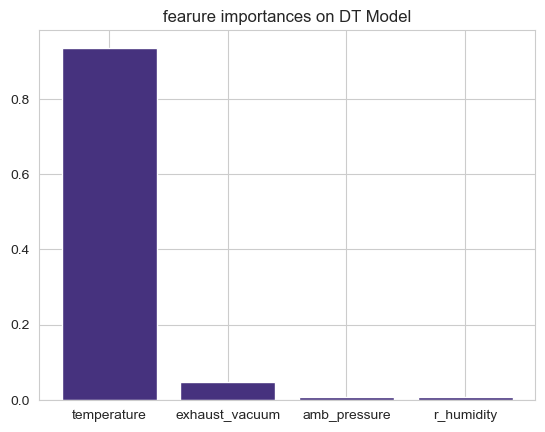

In [125]:
plt.title("fearure importances on DT Model")
plt.bar(x=['temperature', 'exhaust_vacuum', 'amb_pressure', 'r_humidity'],height=DT_model.feature_importances_)

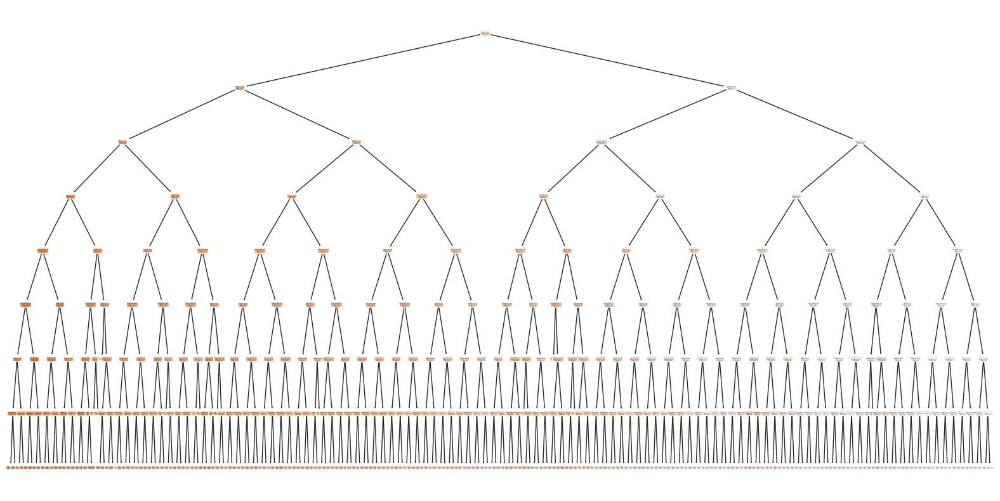

In [126]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

plt.figure(figsize=(20, 10))
plot_tree(DT_model, feature_names=['temperature', 'exhaust_vacuum', 'amb_pressure', 'r_humidity'], filled=True)
plt.show()

### Test Accuracy for DT Model

In [127]:
predictions = DT_model.predict(x_test_scaled)
DTmse = mean_squared_error(y_test_scaled, predictions)
DTr2 = r2_score(y_test_scaled, predictions)

print("Mean Squared Error:", DTmse)
print("R-squared:", DTr2)

Mean Squared Error: 0.06184344657456588
R-squared: 0.9381565534254341


So this DT model performs better than MLR model based on R squared values....let us explore more models

In [128]:
PREDICTION["XGB_Predicted"]=(DT_model.predict(x_test_scaled)*np.std(y_test))+np.mean(y_test)

In [171]:
# Assuming you have a variable PREDICTION["STACK_Predicted"] that holds the predicted values
print("Predicted values:", PREDICTION["XGB_Predicted"])


Predicted values: 0       434.137354
1       447.900734
2       457.284841
3       443.705982
4       442.721854
           ...    
1901    435.874541
1902    435.591313
1903    482.806017
1904    438.696077
1905    449.007219
Name: XGB_Predicted, Length: 1906, dtype: float64


# Random forest regressor

In [129]:
from sklearn.ensemble import RandomForestRegressor

In [130]:
params={
    'n_estimators':[10,30,50],
    'max_depth':[4,5,8,10,15],
    'min_samples_split':range(1,5,1)
}

In [131]:
RFmodel=RandomForestRegressor(random_state=0)

In [132]:
RFgcv=GridSearchCV(estimator=RFmodel,param_grid=params,cv=10)

In [133]:
RFgcv.fit(x_train_scaled, y_train_scaled)

GridSearchCV(cv=10, estimator=RandomForestRegressor(random_state=0),
             param_grid={'max_depth': [4, 5, 8, 10, 15],
                         'min_samples_split': range(1, 5),
                         'n_estimators': [10, 30, 50]})

In [134]:
results = RFgcv.cv_results_

In [135]:
best_scores = results['mean_test_score']
sorted_indices = best_scores.argsort()[::-1]
best_scores = best_scores[sorted_indices]
params = [results['params'][i] for i in sorted_indices]

# display the best scores for all parameters in descending order
for i, score in enumerate(best_scores):
    print("Parameters:", params[i], "Score:", score)

Parameters: {'max_depth': 4, 'min_samples_split': 1, 'n_estimators': 10} Score: nan
Parameters: {'max_depth': 15, 'min_samples_split': 1, 'n_estimators': 50} Score: nan
Parameters: {'max_depth': 10, 'min_samples_split': 1, 'n_estimators': 10} Score: nan
Parameters: {'max_depth': 8, 'min_samples_split': 1, 'n_estimators': 50} Score: nan
Parameters: {'max_depth': 8, 'min_samples_split': 1, 'n_estimators': 30} Score: nan
Parameters: {'max_depth': 8, 'min_samples_split': 1, 'n_estimators': 10} Score: nan
Parameters: {'max_depth': 15, 'min_samples_split': 1, 'n_estimators': 10} Score: nan
Parameters: {'max_depth': 15, 'min_samples_split': 1, 'n_estimators': 30} Score: nan
Parameters: {'max_depth': 5, 'min_samples_split': 1, 'n_estimators': 50} Score: nan
Parameters: {'max_depth': 10, 'min_samples_split': 1, 'n_estimators': 50} Score: nan
Parameters: {'max_depth': 5, 'min_samples_split': 1, 'n_estimators': 30} Score: nan
Parameters: {'max_depth': 5, 'min_samples_split': 1, 'n_estimators': 10

In [136]:
RFgcv.best_params_

{'max_depth': 15, 'min_samples_split': 3, 'n_estimators': 50}

In [137]:
RF= RandomForestRegressor(max_depth= 15,min_samples_split=3,n_estimators=50,random_state=0)
model_RF=RF.fit(x_train_scaled,y_train_scaled)

In [138]:
print("Feature Importances:", model_RF.feature_importances_)

Feature Importances: [0.90176403 0.06373342 0.01814663 0.01635591]


<BarContainer object of 4 artists>

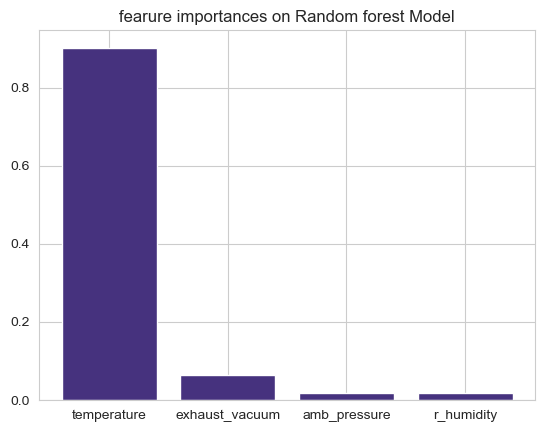

In [139]:
plt.title("fearure importances on Random forest Model")
plt.bar(x=['temperature', 'exhaust_vacuum', 'amb_pressure', 'r_humidity'],height=model_RF.feature_importances_)

In [140]:
model_RF.predict(x_test_scaled)

array([-1.14392201, -0.42050183,  0.13577229, ...,  1.8979922 ,
       -0.90180467, -0.28995064])

In [141]:
predictions = model_RF.predict(x_test_scaled)
rfmse = mean_squared_error(y_test_scaled, predictions)
rfr2 = r2_score(y_test_scaled, predictions)

print("Mean Squared Error:", rfmse)
print("R-squared:", rfr2)

Mean Squared Error: 0.044093571530376255
R-squared: 0.9559064284696238


In [142]:
np.std(x_test)

temperature        7.382819
exhaust_vacuum    12.668779
amb_pressure       5.686361
r_humidity        14.388525
dtype: float64

In [143]:
PREDICTION["RF_Predicted"]=(model_RF.predict(x_test_scaled)*np.std(y_test))+np.mean(y_test)

In [178]:
# Assuming you have a variable PREDICTION["STACK_Predicted"] that holds the predicted values
print("Predicted values:", PREDICTION["RF_Predicted"])


Predicted values: 0       435.105427
1       447.450269
2       456.942838
3       443.806739
4       442.736043
           ...    
1901    436.176201
1902    438.087478
1903    487.014332
1904    439.237051
1905    449.678067
Name: RF_Predicted, Length: 1906, dtype: float64


# SVM

In [144]:
from sklearn.svm import SVR

In [145]:
params={'C':[0.1,1,10],
        'kernel':['linear','rbf'],
        'gamma':[0.1,1]}

In [146]:
svm=SVR()

In [147]:
svmgcv=GridSearchCV(estimator=svm,param_grid=params,cv=10)

In [148]:
svmgcv.fit(x_train_scaled, y_train_scaled)

GridSearchCV(cv=10, estimator=SVR(),
             param_grid={'C': [0.1, 1, 10], 'gamma': [0.1, 1],
                         'kernel': ['linear', 'rbf']})

In [149]:
results = svmgcv.cv_results_

In [150]:
best_scores = results['mean_test_score']
sorted_indices = best_scores.argsort()[::-1]
best_scores = best_scores[sorted_indices]
params = [results['params'][i] for i in sorted_indices]

# display the best scores for all parameters in descending order
for i, score in enumerate(best_scores):
    print("Parameters:", params[i], "Score:", score)

Parameters: {'C': 10, 'gamma': 1, 'kernel': 'rbf'} Score: 0.9496215622928439
Parameters: {'C': 1, 'gamma': 1, 'kernel': 'rbf'} Score: 0.9479066939095822
Parameters: {'C': 10, 'gamma': 0.1, 'kernel': 'rbf'} Score: 0.9429806558665188
Parameters: {'C': 1, 'gamma': 0.1, 'kernel': 'rbf'} Score: 0.9414409070182217
Parameters: {'C': 0.1, 'gamma': 1, 'kernel': 'rbf'} Score: 0.9400203821557762
Parameters: {'C': 0.1, 'gamma': 0.1, 'kernel': 'rbf'} Score: 0.9395009756002398
Parameters: {'C': 0.1, 'gamma': 1, 'kernel': 'linear'} Score: 0.9278500264593499
Parameters: {'C': 0.1, 'gamma': 0.1, 'kernel': 'linear'} Score: 0.9278500264593499
Parameters: {'C': 1, 'gamma': 1, 'kernel': 'linear'} Score: 0.9278313768337318
Parameters: {'C': 1, 'gamma': 0.1, 'kernel': 'linear'} Score: 0.9278313768337318
Parameters: {'C': 10, 'gamma': 1, 'kernel': 'linear'} Score: 0.9278299523918644
Parameters: {'C': 10, 'gamma': 0.1, 'kernel': 'linear'} Score: 0.9278299523918644


In [151]:
svmgcv.best_params_

{'C': 10, 'gamma': 1, 'kernel': 'rbf'}

In [152]:
svm= SVR(C= 10, gamma= 1, kernel='rbf')
model_svm=svm.fit(x_train_scaled,y_train_scaled)

In [153]:
predictions = model_svm.predict(x_test_scaled)
svmmse = mean_squared_error(y_test_scaled, predictions)
svmr2 = r2_score(y_test_scaled, predictions)

print("Mean Squared Error:", svmmse)
print("R-squared:", svmr2)

Mean Squared Error: 0.05126948659056881
R-squared: 0.9487305134094312


In [154]:
PREDICTION["SVM_Predicted"]=(model_svm.predict(x_test_scaled)*np.std(y_test))+np.mean(y_test)

In [175]:
# Assuming you have a variable PREDICTION["STACK_Predicted"] that holds the predicted values
print("Predicted values:", PREDICTION["SVM_Predicted"])

Predicted values: 0       434.357958
1       445.734324
2       457.313633
3       445.133528
4       441.263932
           ...    
1901    435.287586
1902    430.639700
1903    486.061400
1904    439.551412
1905    449.518675
Name: SVM_Predicted, Length: 1906, dtype: float64


# RANSAC REGESSION

In [155]:
from sklearn.linear_model import RANSACRegressor
from sklearn.metrics import r2_score

ransac = RANSACRegressor()

# Fit the model
ransac.fit(x_train_scaled, y_train_scaled)  # Assuming y_train is your target variable

# Make predictions on the test set
predictions_ransac = ransac.predict(x_test_scaled)

# Calculate R-squared score
r2_RANSAC= r2_score(y_test_scaled, predictions_ransac)
print("R-squared Score:", r2_RANSAC)
mse_RANSAC= mean_squared_error(y_test_scaled, predictions_ransac)
print("Mean Squared Error:", mse_RANSAC )
PREDICTION["RANSAC"]=(predictions*np.std(y_test))+np.mean(y_test)

R-squared Score: 0.925871305962487
Mean Squared Error: 0.07412869403751303


In [176]:
# Assuming you have a variable PREDICTION["STACK_Predicted"] that holds the predicted values
print("Predicted values:", PREDICTION["RANSAC"])

Predicted values: 0       434.357958
1       445.734324
2       457.313633
3       445.133528
4       441.263932
           ...    
1901    435.287586
1902    430.639700
1903    486.061400
1904    439.551412
1905    449.518675
Name: RANSAC, Length: 1906, dtype: float64


In [156]:
from sklearn.ensemble import StackingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score

In [157]:
base_models = [
    ("rf", RandomForestRegressor(max_depth= 15,min_samples_split=3,n_estimators=50,random_state=0)),
    ("dt",DecisionTreeRegressor(max_depth= 8, min_samples_split=3,random_state=0)),
    ("svm",SVR(C= 10, gamma= 1, kernel='rbf'))
]

In [158]:
meta_model = LinearRegression()

In [159]:
stacking_regressor = StackingRegressor(estimators=base_models, final_estimator=meta_model)
stacking_regressor.fit(x_train_scaled,y_train_scaled)

StackingRegressor(estimators=[('rf',
                               RandomForestRegressor(max_depth=15,
                                                     min_samples_split=3,
                                                     n_estimators=50,
                                                     random_state=0)),
                              ('dt',
                               DecisionTreeRegressor(max_depth=8,
                                                     min_samples_split=3,
                                                     random_state=0)),
                              ('svm', SVR(C=10, gamma=1))],
                  final_estimator=LinearRegression())

In [160]:
y_pred = stacking_regressor.predict(x_test_scaled)
stack_r2 = r2_score(y_test_scaled, y_pred)
STACKmse = mean_squared_error(y_test_scaled, predictions)
print("R-squared of stack model:", stack_r2)
print("MSE of stack model:", STACKmse)

R-squared of stack model: 0.9567968973082562
MSE of stack model: 0.05126948659056881


In [161]:
PREDICTION["STACK_Predicted"]=(stacking_regressor.predict(x_test_scaled)*np.std(y_test))+np.mean(y_test)

In [177]:
# Assuming you have a variable PREDICTION["STACK_Predicted"] that holds the predicted values
print("Predicted values:", PREDICTION["STACK_Predicted"])


Predicted values: 0       435.015940
1       447.063497
2       456.978091
3       444.042388
4       442.431583
           ...    
1901    435.998239
1902    436.880328
1903    487.285689
1904    439.315054
1905    449.696952
Name: STACK_Predicted, Length: 1906, dtype: float64


# Model Validation

In [162]:
ModelValidation=pd.DataFrame()
ModelValidation["Model"]=["MLR","DT","RandomForest","SVM","Ransac regerssion"]
ModelValidation["R2_values"]=[r22,DTr2,rfr2,svmr2,r2_RANSAC]
ModelValidation=ModelValidation.sort_values("R2_values",ascending=False).reset_index(drop=True)

In [163]:
ModelValidation

,Model,R2_values
0,RandomForest,0.955906
1,SVM,0.948731
2,DT,0.938157
3,MLR,0.928715
4,Ransac regerssion,0.925871


In [164]:
import plotly.express as px

In [165]:
fig=px.bar(ModelValidation,x="Model",y="R2_values",color="R2_values")
fig.update_layout(title_text="R2_values Score Comparison of each Model")
fig.show()

## Pickling the model for deployment

In [169]:
import pickle
pickle.dump(stacking_regressor,open('regmodel.pkl','wb'))
pickled_model=pickle.load(open('regmodel.pkl','rb'))
pickled_model.predict(x_test_scaled)*np.std(y_test)+np.mean(y_test)

array([435.01593958, 447.06349735, 456.97809057, ..., 487.2856894 ,
       439.31505393, 449.69695243])